In this notebook, we will continue with our integration, this time using a stereo-seq dataset to map our RNA-seq onto spatial accurate location using **Tangram** package.

We are going to use two publicly available datasets, thanks to both authors and teams for providing detailed datasets that make this integration possible.

**RNA-seq dataset**: https://www.biorxiv.org/content/10.1101/2023.03.06.531398v2

**Streo-seq dataset**: https://www.cell.com/developmental-cell/fulltext/S1534-5807(22)00249-0?_returnURL=https%3A%2F%2Flinkinghub.elsevier.com%2Fretrieve%2Fpii%2FS1534580722002490%3Fshowall%3Dtrue

Tangram Package: https://www.nature.com/articles/s41592-021-01264-7

Moscot Package: https://www.biorxiv.org/content/10.1101/2023.05.11.540374v1



These are the steps that we will take in this notebook:

1) Preprocessing and visualization

2) Spatial mapping of RNA-seq cells to Stereo-seq cell coordinates using Tangram

3) Visualization of Streo-seq dataset with RNA-seq annotations.

4) Visualzation of RNA-seq dataset with Streo-seq cell coordinates.

5) Cell-Cell interactions based on **scRNA-seq** data:

  5. a) cell-cell communication using ligand-receptor interactions using cellphonedb

  5. b) cell-cell type transition between different developmental stages using zebrafish specific apoptosis genes

6) Cell-Cell interactions based on **Stereo-seq** data:

  6. a) cell-cell communication using ligand-receptor interactions using cellphonedb

  6. b) cell-cell type transition between different developmental stages using zebrafish specific apoptosis genes


In [ ]:
!pip install scanpy tangram-sc igraph leidenalg squidpy moscot

In [ ]:
import os, sys
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import scanpy as sc
import torch
import tangram as tg
import squidpy as sq
import moscot as mt
import moscot.plotting as mtp
from moscot import datasets
from moscot.problems.spatiotemporal import SpatioTemporalProblem
import anndata as ad


Let's start with some preprocessing steps and then visualize both datasets to have a better idea of how it's structured.

## **pre-processing**

In [ ]:
def plot_spatial(filepath, output_plot):
    # Create a new figure and Axes
    fig, ax = plt.subplots()

    # Load spatial data
    ad_sp_all = sc.read_h5ad(filepath)

    # Extract spatial coordinates and slice information
    xs = ad_sp_all.obs['spatial_x'].values
    ys = ad_sp_all.obs['spatial_y'].values
    slices = ad_sp_all.obs['slice'].values

    # Map slice labels to colors using a colormap
    unique_slices = np.unique(slices)
    colors = plt.cm.viridis(np.linspace(0, 1, len(unique_slices)))
    color_dict = dict(zip(unique_slices, colors))

    # Create the scatter plot
    for sl in unique_slices:
        idx = slices == sl
        ax.scatter(xs[idx], ys[idx], s=0.7, color=color_dict[sl], label=f'Slice {sl}')

        # Determine the position above the highest y-point for the label
        highest_y = np.max(ys[idx])
        representative_x = np.mean(xs[idx])  # average x position for stability in x direction

        # Place a label above the highest y position
        ax.text(representative_x, highest_y, f'Slice {sl}', color='black', fontsize=12, ha='center', va='bottom')

    # Set axes labels and title
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_title(filepath.split('/')[-1])  # Use the file name as the title, or customize it

    # Save the plot
    plt.tight_layout()
    plt.savefig(output_plot)
    plt.show()

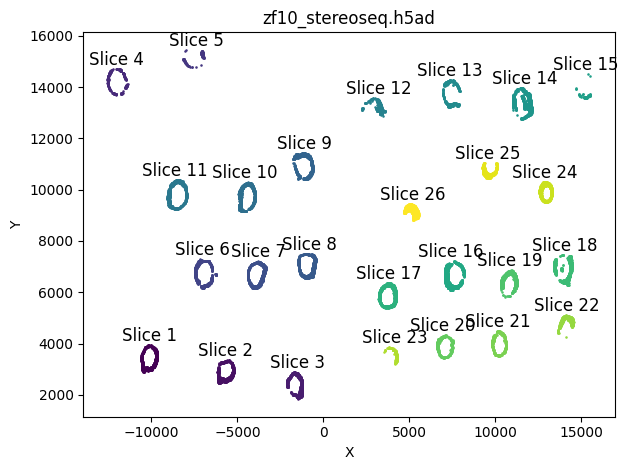

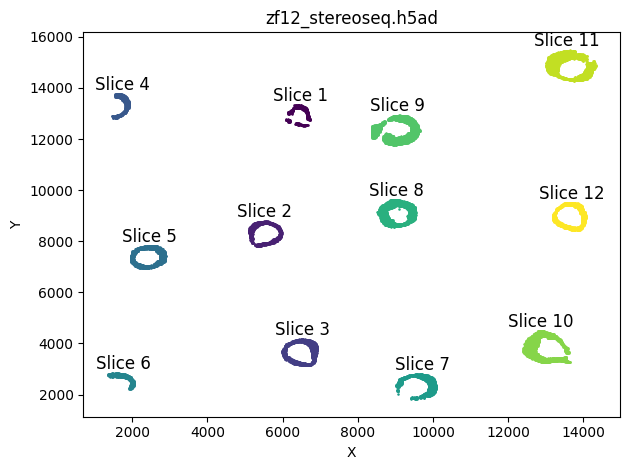

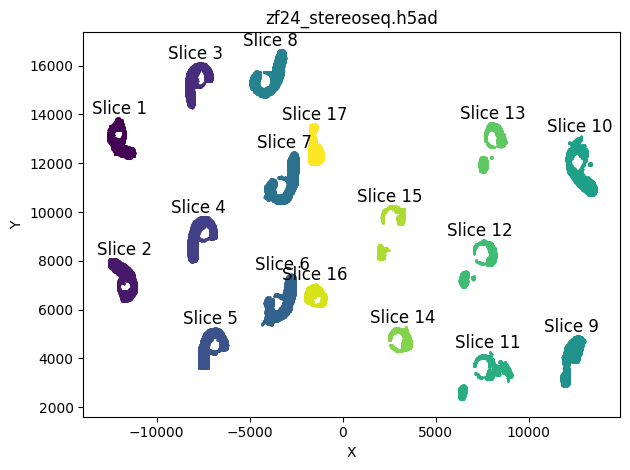

In [ ]:
plot_spatial("zf10_stereoseq.h5ad", 'zf10_spatial.pdf')
plot_spatial("zf12_stereoseq.h5ad", 'zf12_spatial.pdf')
plot_spatial("zf24_stereoseq.h5ad", 'zf24_spatial.pdf')

In [ ]:
### Visualize scRNASeq data

def plot_rnaseq(input_h5ad, timepoint,outdir,outplot):
    ###Import data in h5ad format and invesigate

    adata = sc.read_h5ad(input_h5ad)

    selected_time_points = [timepoint]
    # Filter the AnnData object to keep only cells from the selected time points
    adata = adata[adata.obs['timepoint'].isin(selected_time_points)].copy()

    #############################################################################
    ############################### PREPROCESSING ###############################
    #############################################################################

    ### Sort the adata object by the number of cells by counts
    adata.var.sort_values('n_cells_by_counts')

    ### Filter by minimum number of cells expressed required for a gene to pass filtering. I.e. retain genes that are expressed in at least 3 cells
    sc.pp.filter_genes(adata, min_cells=3)

    ### Retain cells that have at least 200 expressed genes
    sc.pp.filter_cells(adata, min_genes=200)


    ### Retain cells having mito % less than 10

    adata = adata[adata.obs.pct_counts_mt < 10]

    ### Retain cells having nc % less than 4

    adata = adata[adata.obs.pct_counts_nc < 4]


    ###################################################################################
    ################################# DATA NORMALIZATION ##############################
    ###################################################################################

    ### Normalize data to
    sc.pp.normalize_total(adata, target_sum=1e4)

    ### Transform to log scape
    sc.pp.log1p(adata)

    ### Keep the raw data of the adata in a new object
    adata.raw = adata


    #################################################################################
    ################################### Clustering ##################################
    #################################################################################

    ### Find top 2000 variable genes
    sc.pp.highly_variable_genes(adata, n_top_genes=2000)



    ### Select only those genes
    adata = adata[:, adata.var.highly_variable]

    ### Regress out the influence from mitochondrial and non-coding genes
    sc.pp.regress_out(adata,['total_counts','pct_counts_mt','pct_counts_nc'])

    ### Scale the data
    sc.pp.scale(adata,max_value=10)


    ### Copute the Principal Components
    sc.tl.pca(adata, svd_solver='arpack')



    ### Find nearest neighbors
    sc.pp.neighbors(adata, n_pcs=30)


    ### Compute the UMAP
    sc.tl.umap(adata)


    ### Find clusters with Leiden method
    sc.tl.leiden(adata, resolution=0.5)


    ### Coloring based on identified clusters using Leiden method
    sc.settings.figdir = outdir

    sc.pl.umap(adata, color=['zebrafish_anatomy_ontology_class'], save=outplot)


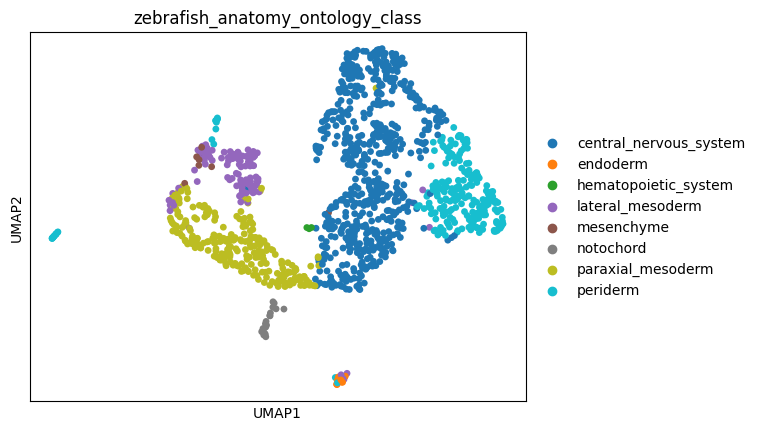

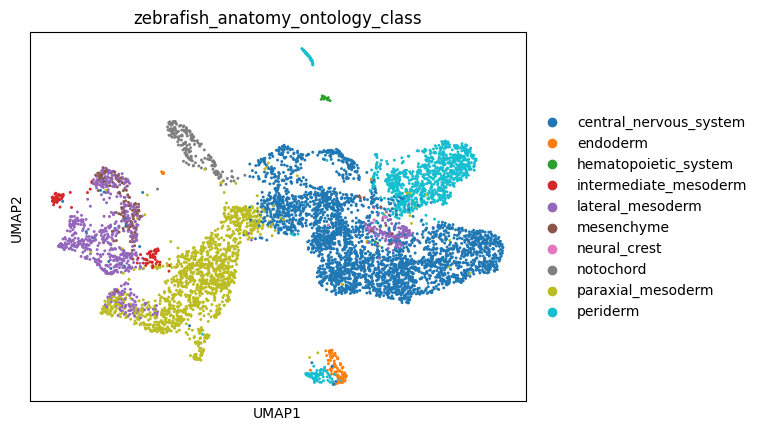

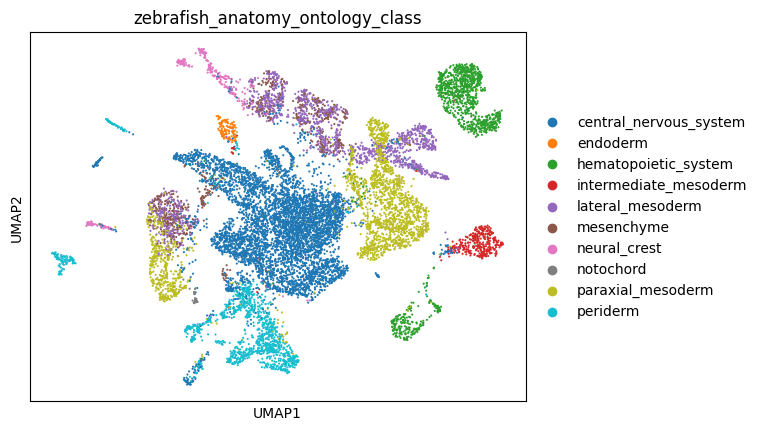

In [ ]:
plot_rnaseq("zf_atlas_10hpf_v4_release.h5ad","10hpf","/results/10/","10hpf_umap_leiden.pdf")
plot_rnaseq("zf_atlas_12hpf_v4_release.h5ad","12hpf","/results/12/","12hpf_umap_leiden.pdf")
plot_rnaseq("zf_atlas_24hpf_v4_release.h5ad","24hpf","/results/24/","24hpf_umap_leiden.pdf")

Great! Now let's jump into the next step to start our mapping processes.

## **spatial mapping**

In this step, we are going to use only the 12hpf timepoint of both datasets. You can repeat the same processes for every other timepoint. We will be using marker genes for each cell type in our scRNA-seq to train our model. These genes will be essential in the processes of mapping since they will be used to map cells based on their gene expression similarities.

INFO:root:779 training genes are saved in `uns``training_genes` of both single cell and spatial Anndatas.
INFO:root:17853 overlapped genes are saved in `uns``overlap_genes` of both single cell and spatial Anndatas.
INFO:root:uniform based density prior is calculated and saved in `obs``uniform_density` of the spatial Anndata.
INFO:root:rna count based density prior is calculated and saved in `obs``rna_count_based_density` of the spatial Anndata.
INFO:root:Allocate tensors for mapping.
INFO:root:Begin training with 779 genes and rna_count_based density_prior in cells mode...
INFO:root:Printing scores every 100 epochs.


Score: 0.185, KL reg: 0.017
Score: 0.291, KL reg: 0.002
Score: 0.302, KL reg: 0.002
Score: 0.304, KL reg: 0.002
Score: 0.305, KL reg: 0.001
Score: 0.306, KL reg: 0.001
Score: 0.306, KL reg: 0.001
Score: 0.306, KL reg: 0.001
Score: 0.306, KL reg: 0.001
Score: 0.307, KL reg: 0.001


INFO:root:Saving results..


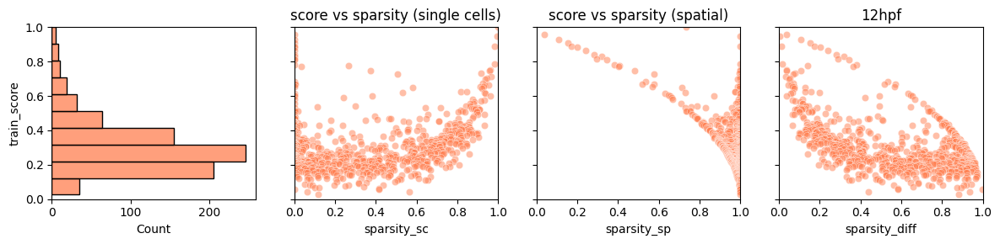

INFO:root:spatial prediction dataframe is saved in `obsm` `tangram_ct_pred` of the spatial AnnData.


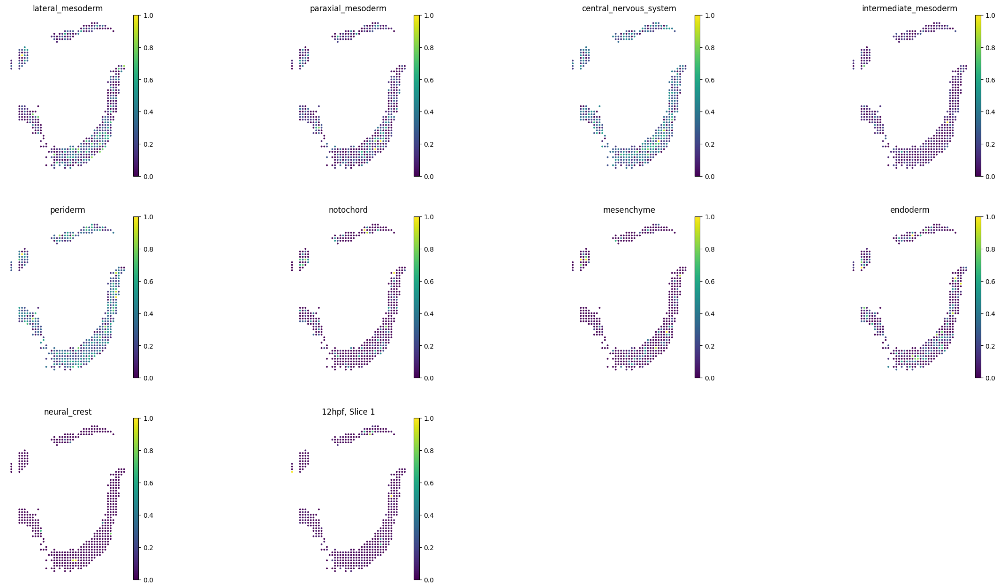

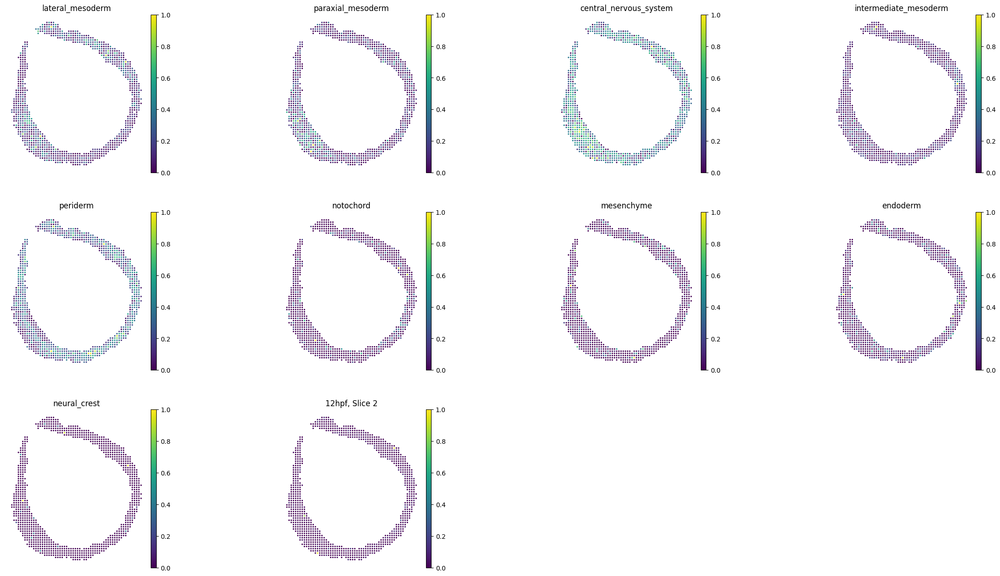

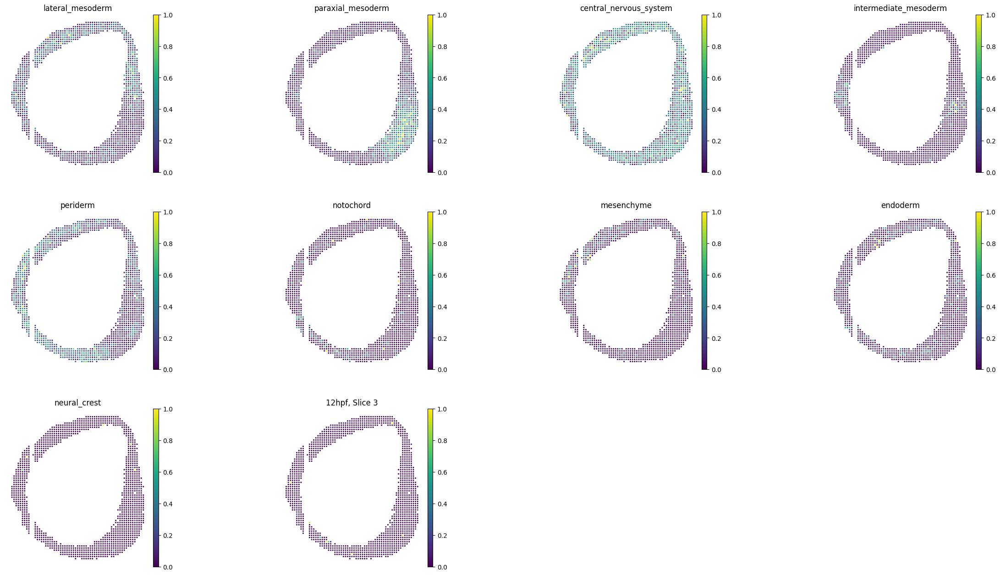

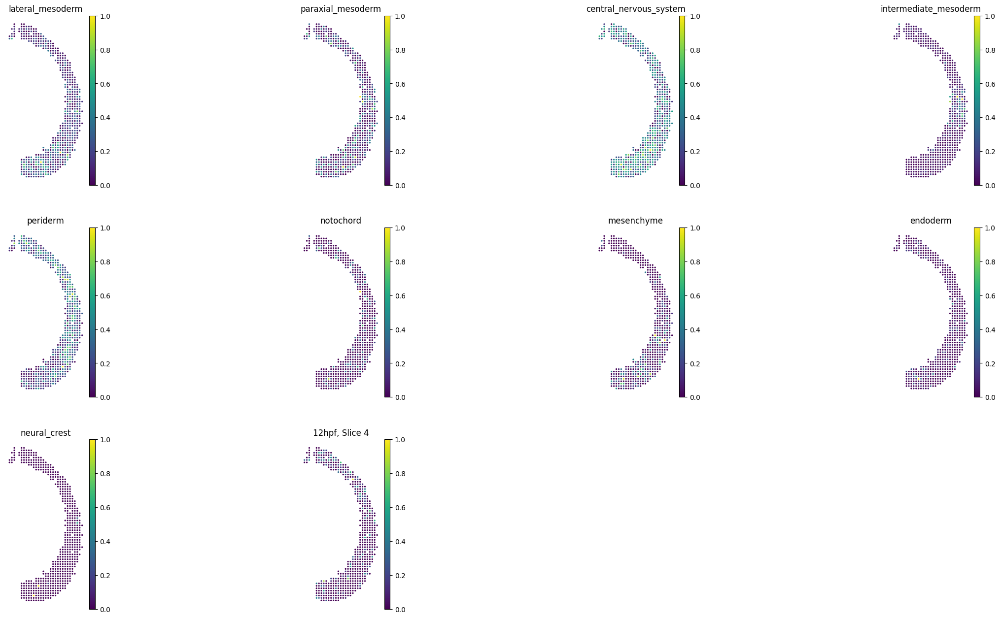

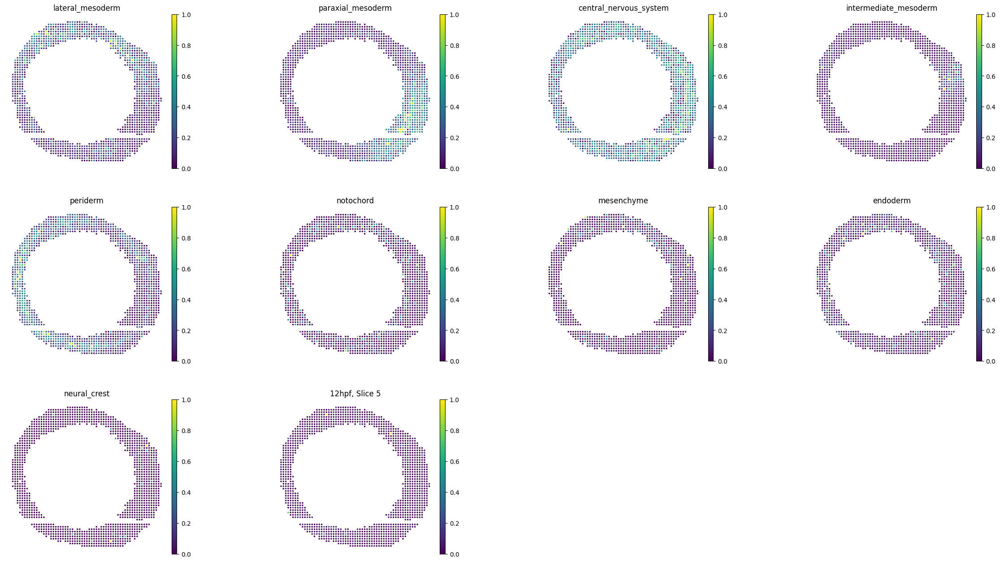

...

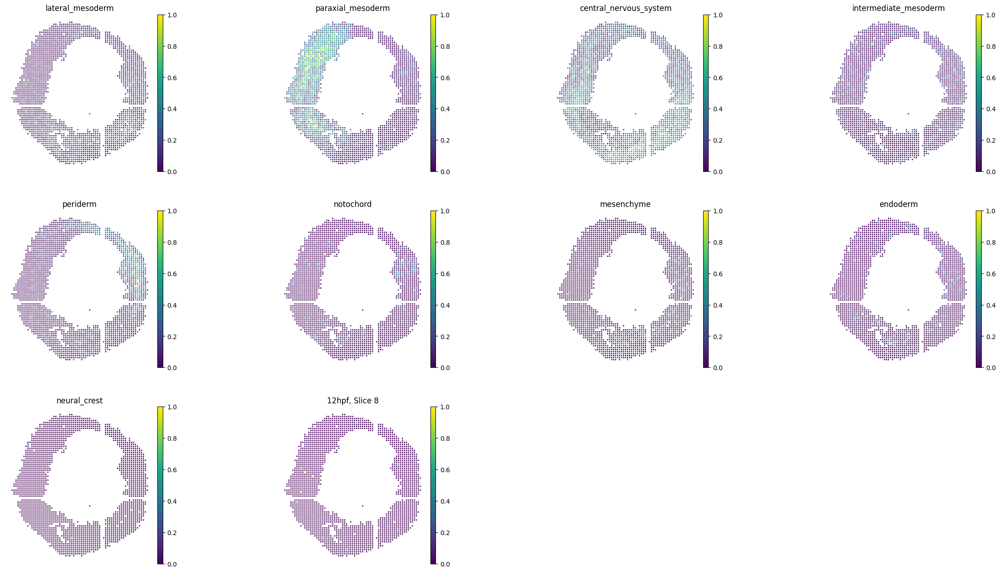

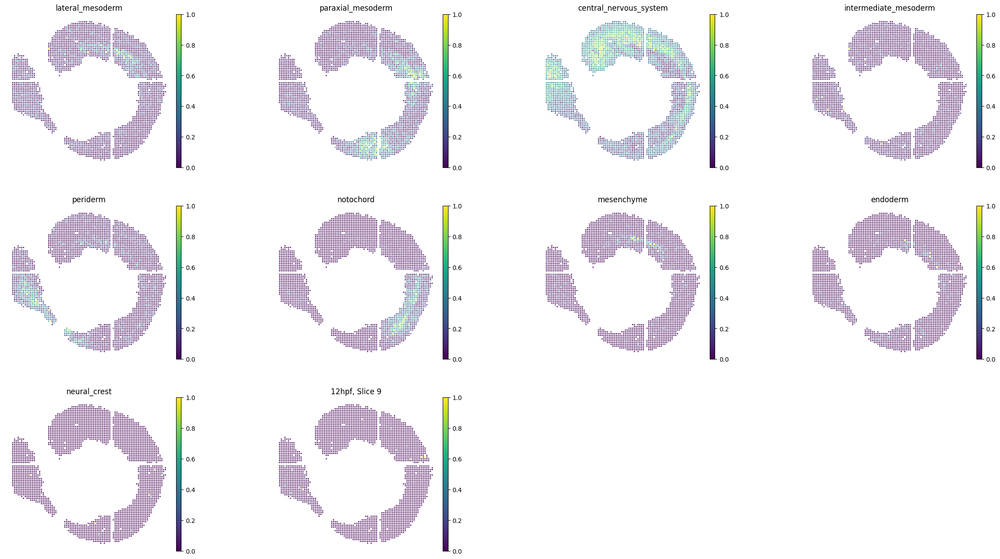

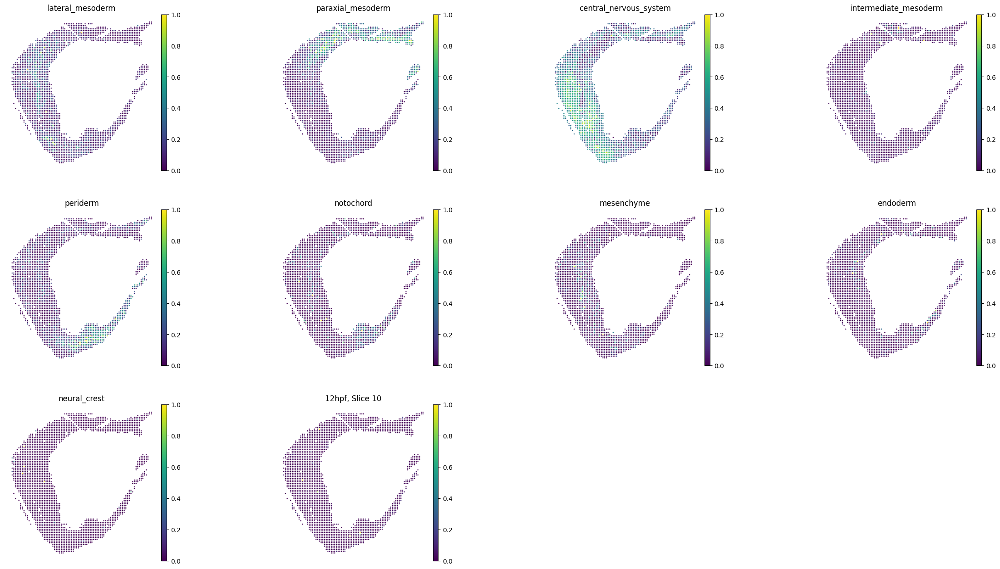

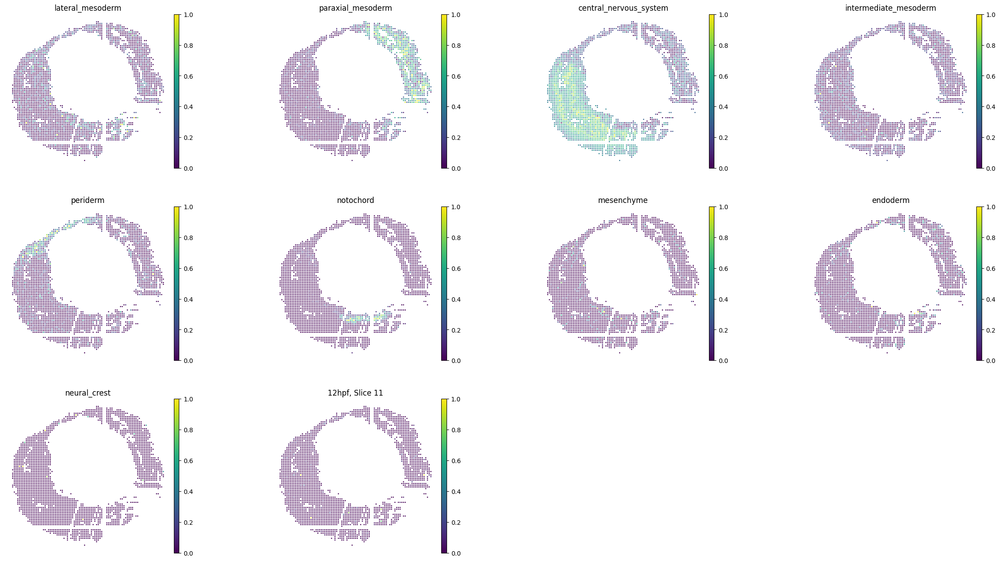

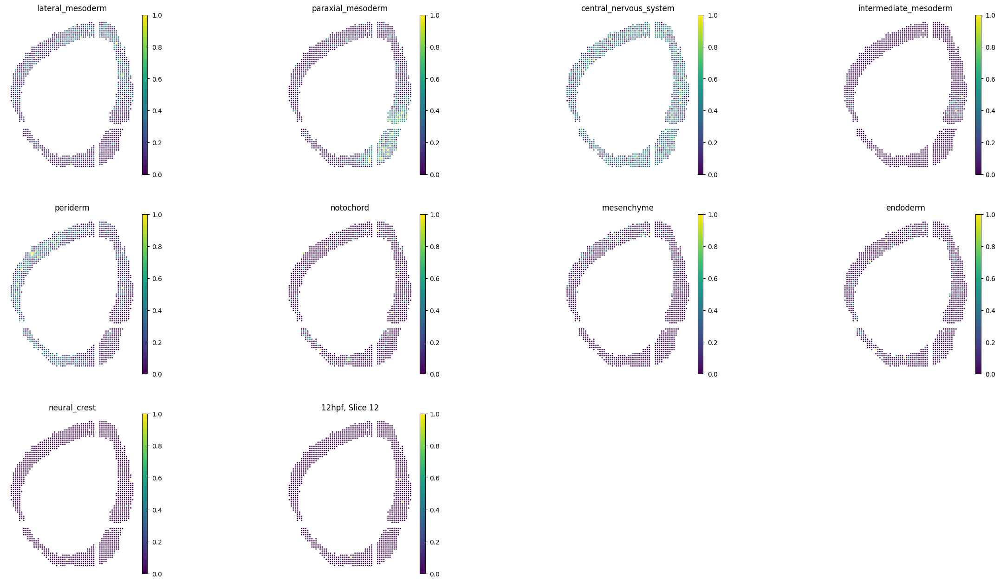

In [ ]:
input_scRNAseq = "zf_atlas_12hpf_v4_release.h5ad"
input_spatial = "zf12_stereoseq.h5ad"
dev_stage =  "12hpf"
out_dir =   "results/12/"




sc_data = sc.read_h5ad(input_scRNAseq)


sc.tl.rank_genes_groups(sc_data, groupby="zebrafish_anatomy_ontology_class", use_raw=False)
markers_df = pd.DataFrame(sc_data.uns["rank_genes_groups"]["names"]).iloc[0:100, :]
markers = list(np.unique(markers_df.melt().value.values))
len(markers)

################################################
#### Preprocessing: the same steps as above ####
################################################
### Retain genes that are expressed in at least 3 cells
sc.pp.filter_genes(sc_data, min_cells=3)
### Retain cells that have at least 200 expressed genes
sc.pp.filter_cells(sc_data, min_genes=200)
### Retain cells having mito % less than 10
sc_data = sc_data[sc_data.obs.pct_counts_mt < 10]
### Retain cells having nc % less than 4
sc_data = sc_data[sc_data.obs.pct_counts_nc < 4]
### Normalize data to
sc.pp.normalize_total(sc_data, target_sum=1e4)
### Transform to log scape
sc.pp.log1p(sc_data)
### Keep the raw data of the adata in a new object
sc_data.raw = sc_data


### Find top 1000 variable genes
sc.pp.highly_variable_genes(sc_data, n_top_genes=1000)
highly_variable_genes = sc_data.var_names[sc_data.var['highly_variable']]

### Load spatial data
sp_data = sc.read_h5ad(input_spatial)



### Training
tg.pp_adatas(sc_data, sp_data, genes=markers)





assert sc_data.uns['training_genes'] == sp_data.uns['training_genes']

ad_map = tg.map_cells_to_space(
adata_sc=sc_data,
adata_sp=sp_data,
# device='cpu')
device='cuda:0')

### Plot training scores'layer_annotation'
tg.plot_training_scores(ad_map, bins=10, alpha=.5)
plt.title(f"{dev_stage}")

# Save and show the plot
plt.savefig(f"{out_dir}{dev_stage}_metrics.pdf")
plt.show()



tg.project_cell_annotations(ad_map, sp_data, annotation='zebrafish_anatomy_ontology_class')
annotation_list = list(pd.unique(sc_data.obs['zebrafish_anatomy_ontology_class']))

# Get unique slice values
unique_slices = sp_data.obs['slice'].unique()

# Loop over each unique slice value
for slice_value in unique_slices:
    # Filter sp_data for the current slice value
    sp_data_sl = sp_data[sp_data.obs['slice'] == slice_value]

    # Plot cell annotation for the current slice
    tg.plot_cell_annotation_sc(sp_data_sl, annotation_list, x='spatial_x', y='spatial_y', spot_size=10, scale_factor=0.1, perc=0.001)

    # Add a title for the current slice
    plt.title(f"{dev_stage}, Slice {slice_value}")

    # Save and show the plot for the current slice
    plt.savefig(f"{out_dir}{dev_stage}_slice{slice_value}.pdf")
    plt.show()





Fantastic! It's evident that certain cell types are more prevalent in specific regions of the zebrafish than others. We will explore this further in the next step. But first, we need to transfer the coordinates from the Stereo-seq data to the RNA-seq data, utilizing the ad_map data object which results from our training processes.

In [ ]:

sp_data

AnnData object with n_obs × n_vars = 16733 × 18948
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'seurat_clusters', 'spatial_x', 'spatial_y', 'slice', 'time_point', 'bin_annotation', 'colors', 'layer_annotation', 'layer_colors'
    layers: 'counts'

In [ ]:
sp_data

AnnData object with n_obs × n_vars = 16733 × 18948
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'seurat_clusters', 'spatial_x', 'spatial_y', 'slice', 'time_point', 'bin_annotation', 'colors', 'layer_annotation', 'layer_colors'
    layers: 'counts'

In [ ]:
sc_data

AnnData object with n_obs × n_vars = 6699 × 24027
    obs: 'n_genes', 'n_counts', 'fish', 'timepoint_cluster', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_nc', 'pct_counts_nc', 'developmental_stage', 'timepoint', 'zebrafish_anatomy_ontology_class', 'zebrafish_anatomy_ontology_id'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'nc', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'sparsity'
    uns: 'global_annotation_colors', 'timepoint_colors', 'zebrafish_anatomy_ontology_class_colors', 'zebrafish_anatomy_ontology_id_colors', 'rank_genes_groups', 'log1p', 'hvg', 'training_genes', 'overlap_genes'
    obsm: 'X_umap'
    layers: 'counts'

In [ ]:
ad_map

AnnData object with n_obs × n_vars = 6699 × 16733
    obs: 'n_genes', 'n_counts', 'fish', 'timepoint_cluster', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_nc', 'pct_counts_nc', 'developmental_stage', 'timepoint', 'zebrafish_anatomy_ontology_class', 'zebrafish_anatomy_ontology_id'
    var: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'seurat_clusters', 'spatial_x', 'spatial_y', 'slice', 'time_point', 'bin_annotation', 'colors', 'layer_annotation', 'layer_colors', 'uniform_density', 'rna_count_based_density'
    uns: 'train_genes_df', 'training_history'

In [ ]:
from scipy.sparse import csr_matrix


def assign_values_from_mapping(sc_data, spatial_data, mapping_matrix, attribute_name):
    # Result array
    result = np.empty(sc_data.n_obs, dtype=object)

    # Check if attribute exists
    if attribute_name in spatial_data.obs.columns:
        attribute_values = spatial_data.obs[attribute_name]
        # If the mapping matrix is sparse, convert it to a dense format to use numpy operations
        if isinstance(mapping_matrix, csr_matrix):
            mapping_matrix = mapping_matrix.toarray()

        # Assign the attribute based on the highest weight
        for i in range(sc_data.n_obs):
            weights = mapping_matrix[i]
            if weights.sum() > 0:  # Only proceed if there are non-zero weights
                # Find index of max weight
                max_index = np.argmax(weights)
                # Assign the attribute from spatial_data corresponding to max weight
                result[i] = attribute_values.iloc[max_index]
            else:
                result[i] = np.nan  # Handle cases with no mapping

        sc_data.obs[attribute_name] = result
    else:
        print(f"Attribute {attribute_name} not found in spatial_data.")


assign_values_from_mapping(sc_data, sp_data, ad_map.X, 'slice')
assign_values_from_mapping(sc_data, sp_data, ad_map.X, 'spatial_x')
assign_values_from_mapping(sc_data, sp_data, ad_map.X, 'spatial_y')

In [ ]:
sc_data

AnnData object with n_obs × n_vars = 6699 × 24027
    obs: 'n_genes', 'n_counts', 'fish', 'timepoint_cluster', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_nc', 'pct_counts_nc', 'developmental_stage', 'timepoint', 'zebrafish_anatomy_ontology_class', 'zebrafish_anatomy_ontology_id', 'slice', 'spatial_x', 'spatial_y'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'nc', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'sparsity'
    uns: 'global_annotation_colors', 'timepoint_colors', 'zebrafish_anatomy_ontology_class_colors', 'zebrafish_anatomy_ontology_id_colors', 'rank_genes_groups', 'log1p', 'hvg', 'training_genes', 'overlap_genes'
    obsm: 'X_umap'
    layers: 'counts'

Great, it seems that coordinates are transferred to our scRNA-seq dataset. Let's visualize our Streo-seq data with our RNA-seq labels in the next step.

In [ ]:

tg.project_cell_annotations(ad_map, sp_data,annotation='zebrafish_anatomy_ontology_class')
annotation_list = list(pd.unique(sc_data.obs['zebrafish_anatomy_ontology_class']))



INFO:root:spatial prediction dataframe is saved in `obsm` `tangram_ct_pred` of the spatial AnnData.


## Streo-seq Visualization

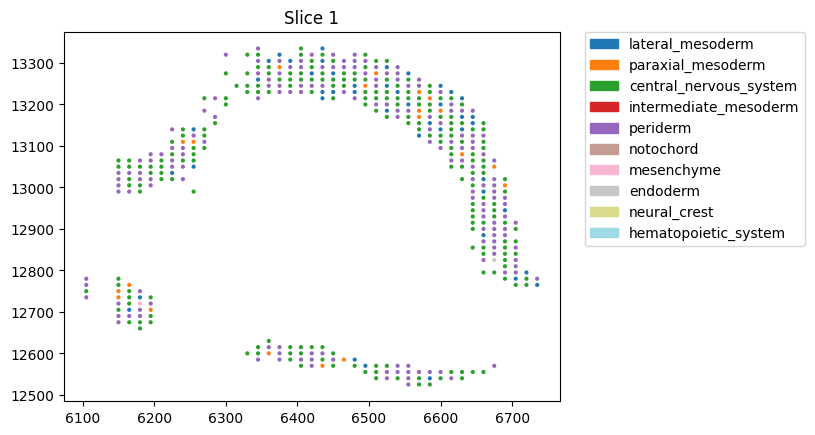

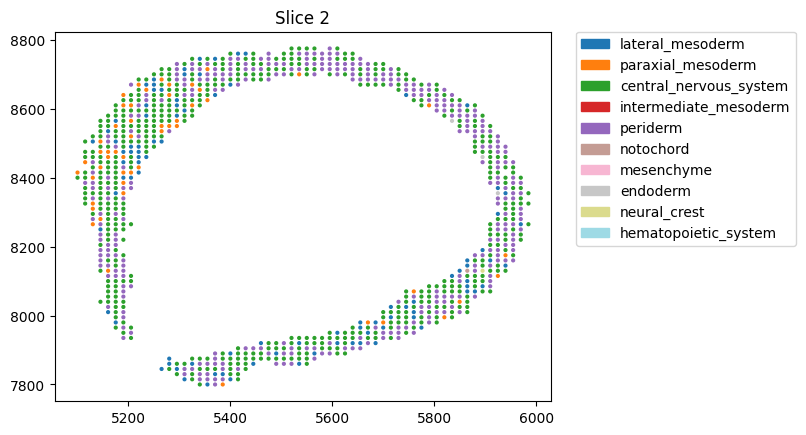

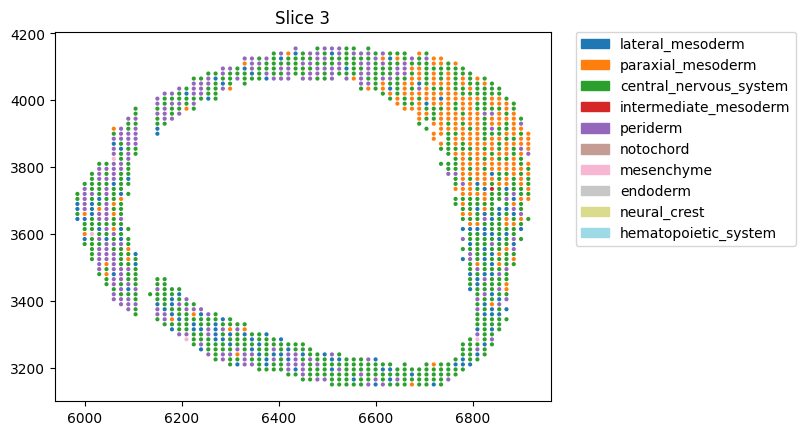

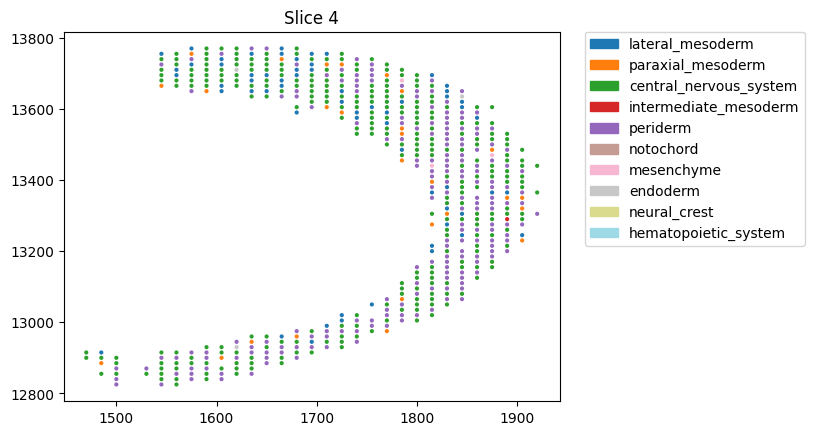

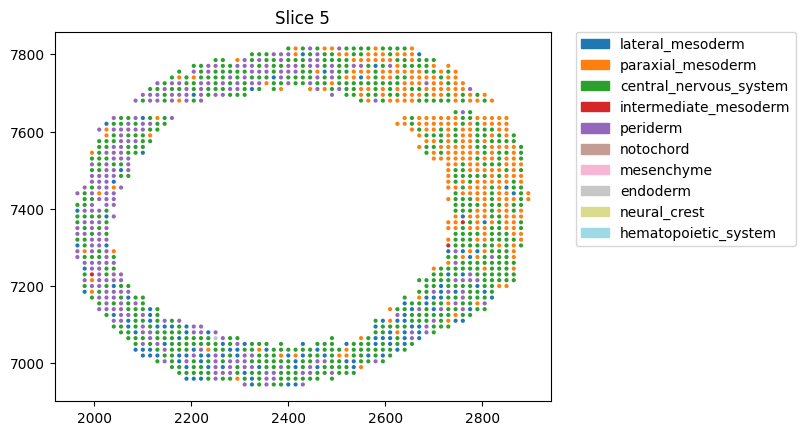

...

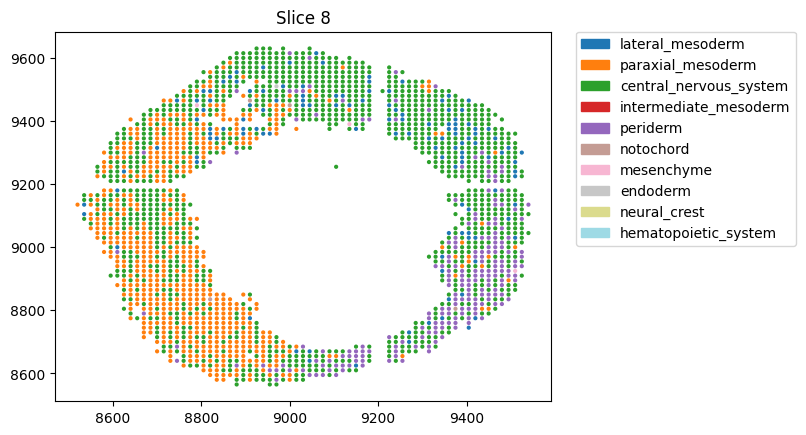

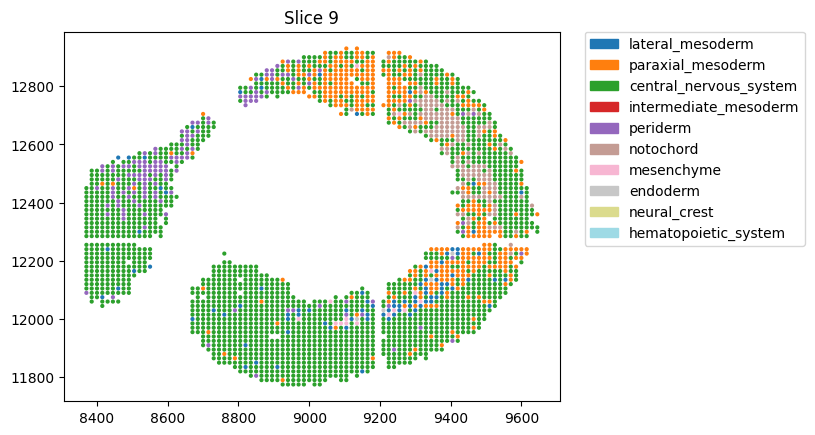

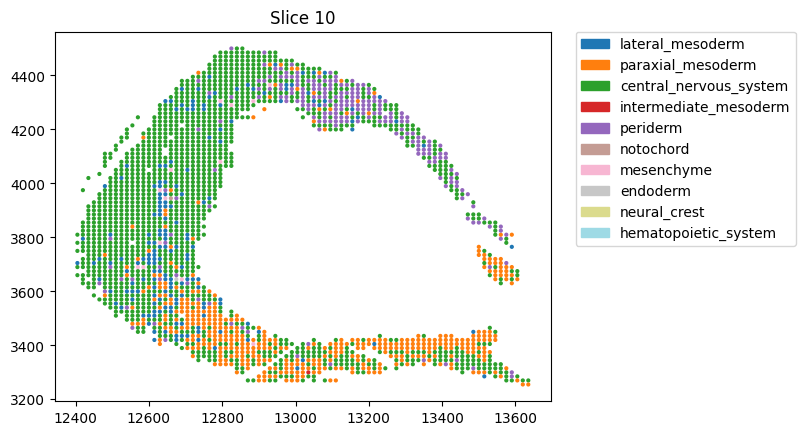

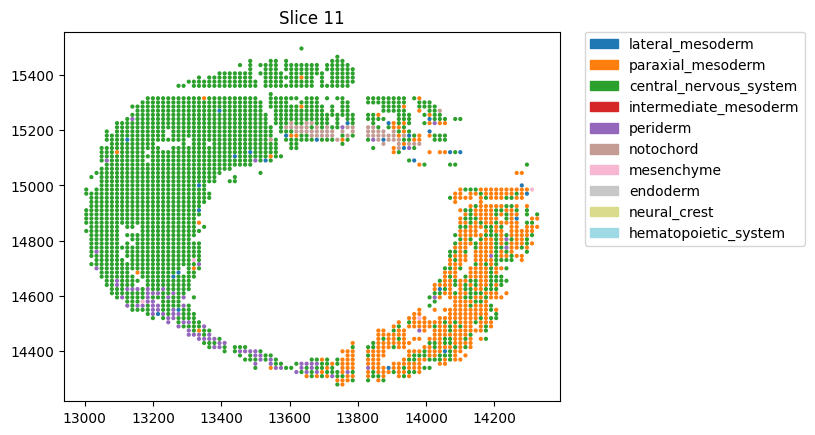

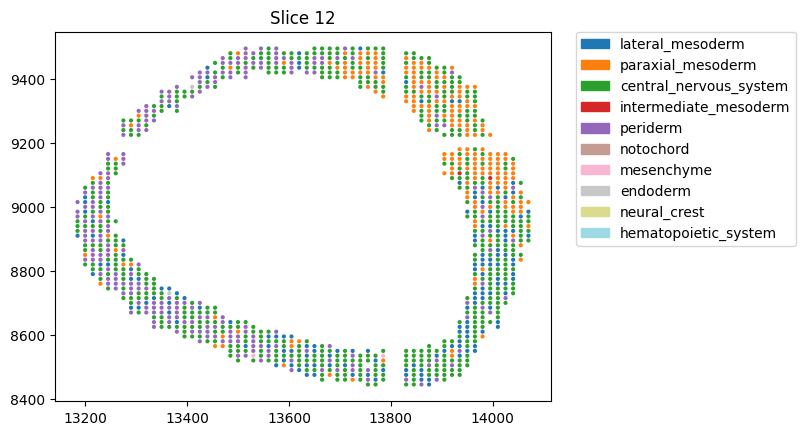

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize
from matplotlib.cm import ScalarMappable
import matplotlib.patches as mpatches





colors = plt.cm.tab20(np.linspace(0, 1, len(annotation_list)))
color_dict = dict(zip(annotation_list, colors))

# Create a plot for each slice
for slice_value in unique_slices:
    # Filter sp_data for the current slice value
    sp_data_sl = sp_data[sp_data.obs['slice'] == slice_value]

    # Get the cell type predictions for the current slice
    ct_probs_sl = sp_data_sl.obsm['tangram_ct_pred']

    # Determine the cell type with the highest probability for each cell
    dominant_ct = ct_probs_sl.idxmax(axis=1)

    # Map the dominant cell type to its color
    cell_colors = dominant_ct.map(color_dict)

    # Prepare to plot
    fig, ax = plt.subplots()

    # Scatter plot with colored cells
    ax.scatter(
        sp_data_sl.obs['spatial_x'],
        sp_data_sl.obs['spatial_y'],
        c=cell_colors,  # Use the mapped colors
        s=4  # Adjust the size of the dots as needed
    )

    # Create a legend
    # We will make a legend entry for each cell type
    patches = [mpatches.Patch(color=color_dict[ct], label=ct) for ct in annotation_list]
    plt.legend(handles=patches, bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)

    # Add a title and save the plot
    plt.title(f"Slice {slice_value}")
    # plt.savefig(f"{out_dir}slice{slice_value}.pdf", bbox_inches='tight')
    plt.show()

Let's pick slide 8 as an example and compare our integrated RNA-seq labels to Streo-seq annotation.

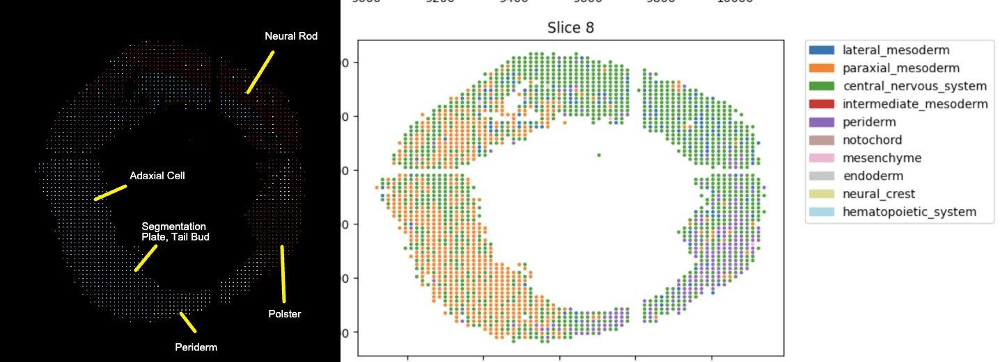

In [ ]:
from IPython.display import Image

# Display an image file
Image(filename='/content/annotation.jpg')


- **Paraxial Mesoderm (RNA-seq label) and Adaxial Cells (Streo-seq label)**: Adaxial cells are a specialized subset of cells within the somites of the paraxial mesoderm. They are specifically positioned and differentiated to form particular muscle tissues close to the central nervous system.

- The **polster** and **periderm**: They are close to each other in the head region. The periderm, as an external layer, overlays the polster and other underlying structures, offering protection to these more internally positioned cells.

- The neural rod develops into the neural tube, which subsequently differentiates into the CNS. The anterior part of the neural tube becomes the brain, while the posterior portion develops into the spinal cord.

Amazing! We can see that our labels have close proximity with our target datasets labels.

## scRNA-seq Visualization

In this step we will visualize our RNA-seq dataset using Streo-seq cell coordinates that we learned via our trained model.  

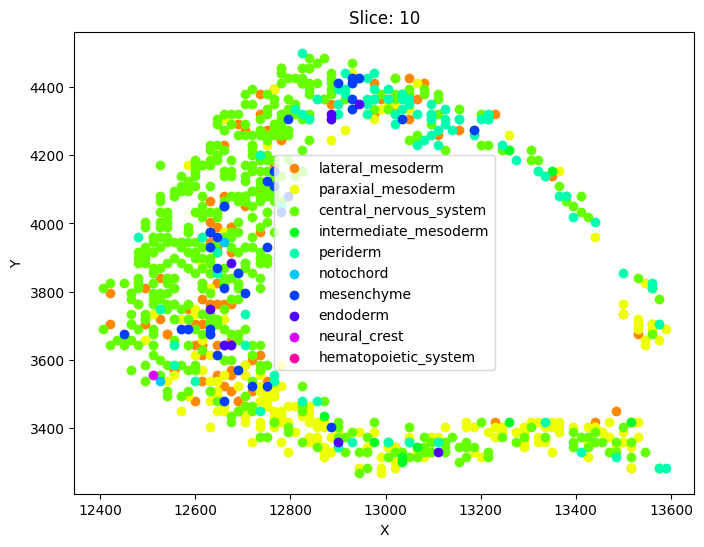

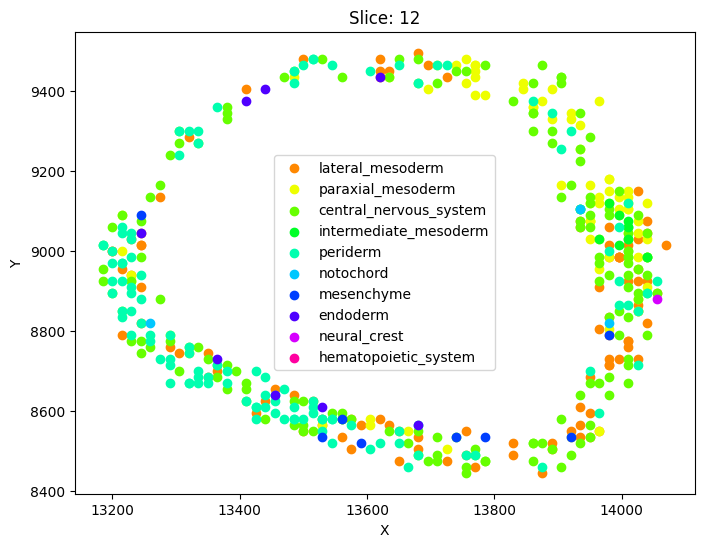

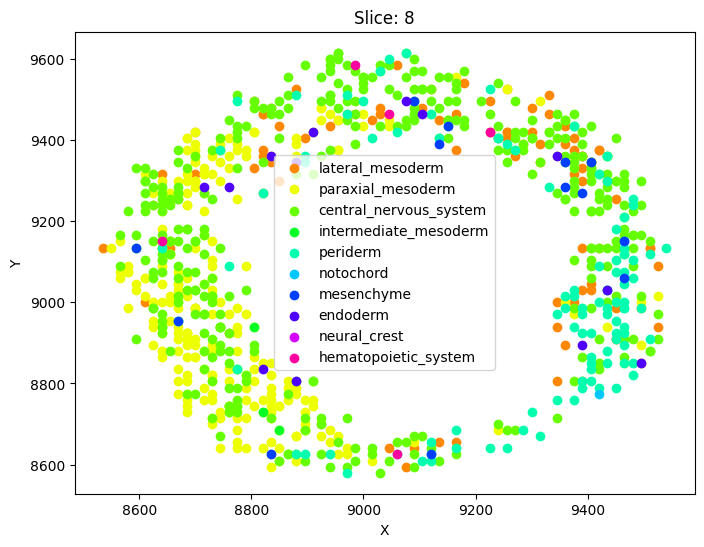

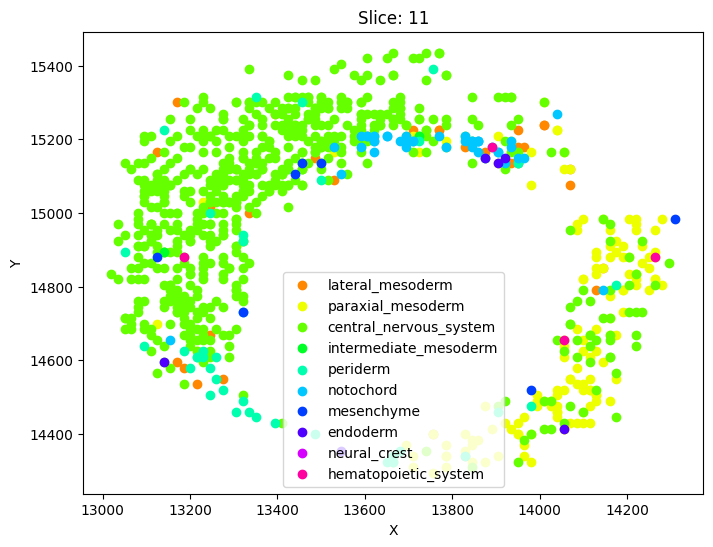

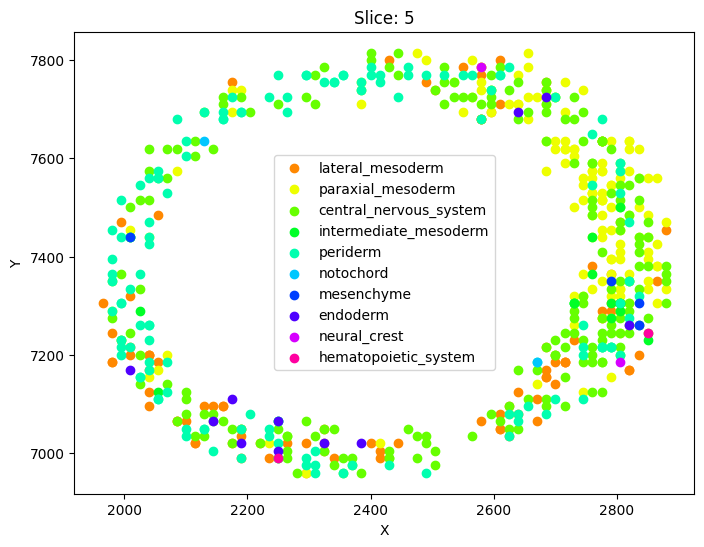

...

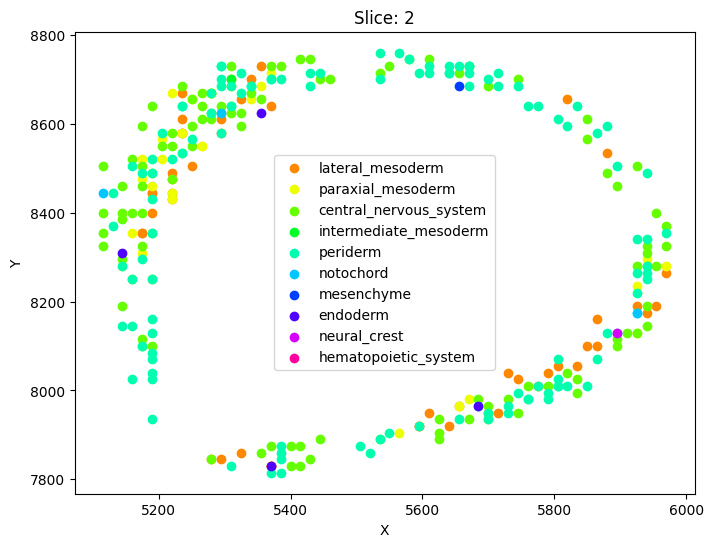

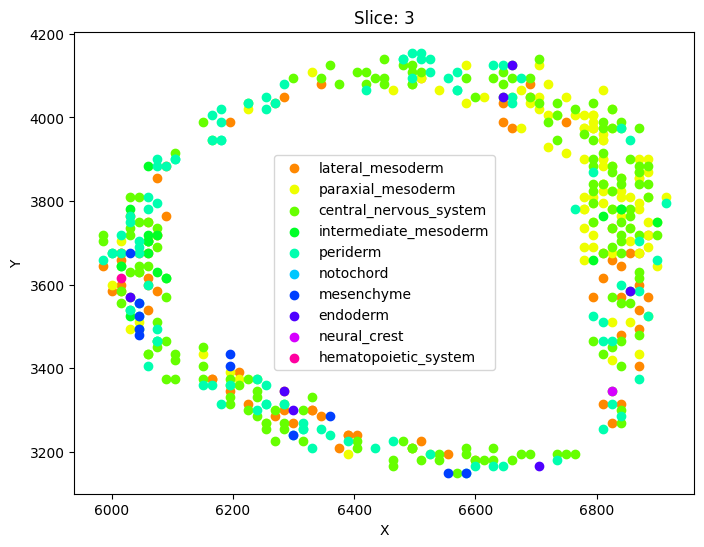

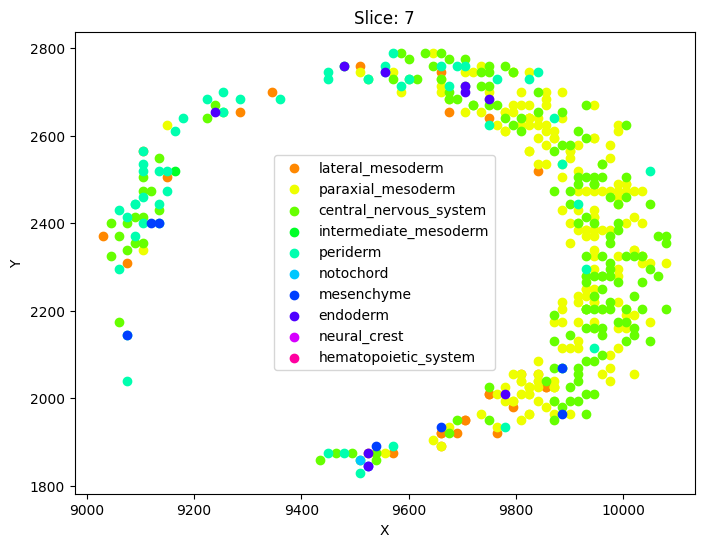

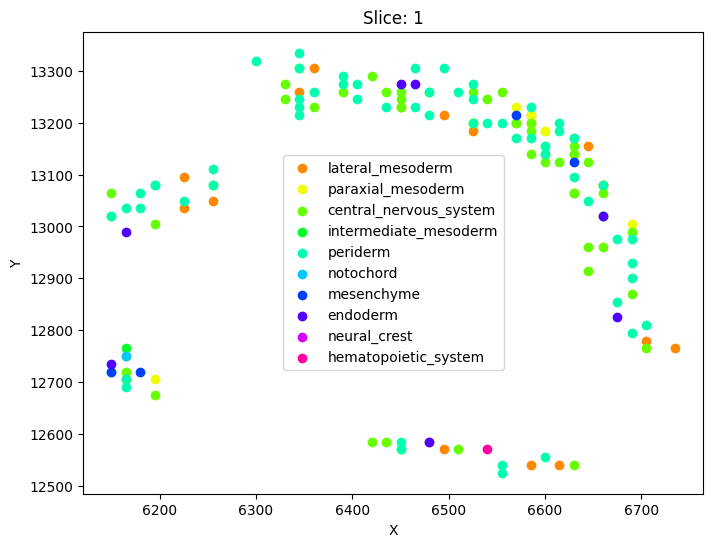

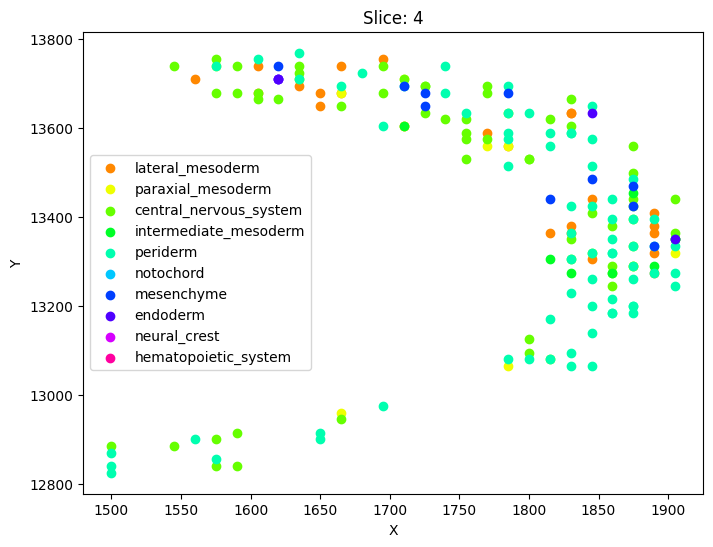

In [ ]:
# Get unique slices
slices = sc_data.obs['slice'].unique()

# Set up colors for each zebrafish class label
class_labels = list(sc_data.obs['zebrafish_anatomy_ontology_class'].unique())
color_palette = sns.color_palette("hsv", len(class_labels))
class_color_map = dict(zip(class_labels, color_palette))

# Plot each slice separately
for slice_name in slices:
    plt.figure(figsize=(8, 6))
    plt.title(f'Slice: {slice_name}')
    plt.xlabel('X')
    plt.ylabel('Y')

    # Filter cells belonging to the current slice
    slice_cells = sc_data[sc_data.obs['slice'] == slice_name]

    # Plot each cell
    for class_label in class_labels:
        class_cells = slice_cells[slice_cells.obs['zebrafish_anatomy_ontology_class'] == class_label]
        plt.scatter(class_cells.obs['spatial_x'],
                    class_cells.obs['spatial_y'],
                    color=class_color_map[class_label], label=class_label)

    plt.legend()
    plt.show()

## **cell-cell interactions for Streo-seq**

### cell cell communication

In [ ]:
#load only 24hpf timpoint in sp_data



import anndata as ad
cluster_key = "zebrafish_anatomy_ontology_class"

# Load the data
adata = sp_data
print(adata)

adata.obsm['spatial'] = np.vstack([adata.obs['spatial_x'].values, adata.obs['spatial_y'].values]).T
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)



sq.gr.ligrec(adata,n_perms=1000,cluster_key="zebrafish_anatomy_ontology_class", n_jobs=8, use_raw=False, transmitter_params={"categories": "ligand"},
receiver_params={"categories": "receptor"} )

clusters = adata.obs.zebrafish_anatomy_ontology_class.cat.categories
means = adata.uns["zebrafish_anatomy_ontology_class_ligrec"]["means"]
pval = adata.uns["zebrafish_anatomy_ontology_class_ligrec"]["pvalues"]

interactions = np.ma.masked_where((pval < 0.9) & (means>1), means).mask.sum(0)
interactions = np.reshape(interactions, (clusters.shape[0],clusters.shape[0]))
adata.uns["zebrafish_anatomy_ontology_class_interactions"] = interactions
sq.pl.interaction_matrix(adata, cluster_key = "zebrafish_anatomy_ontology_class")

AnnData object with n_obs × n_vars = 72175 × 26365
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'seurat_clusters', 'spatial_x', 'spatial_y', 'slice', 'time_point', 'bin_annotation', 'colors', 'layer_annotation', 'layer_colors', 'uniform_density', 'rna_count_based_density', 'zebrafish_anatomy_ontology_class', 'max_probability_value'
    var: 'n_cells', 'sparsity'
    uns: 'overlap_genes', 'training_genes'
    obsm: 'tangram_ct_pred'
    layers: 'counts'


  0%|          | 0/1000 [00:00<?, ?permutation/s]

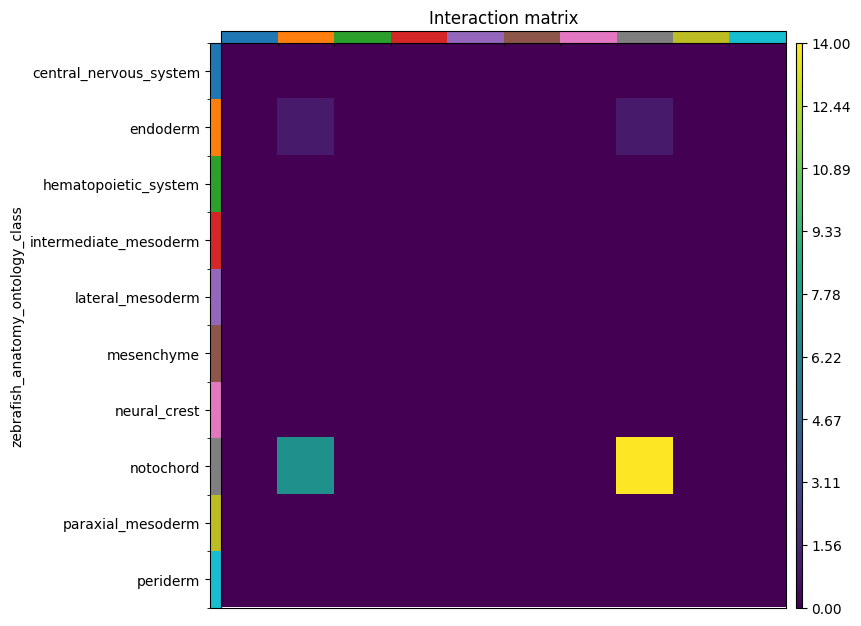

- By 24 hpf, zebrafish development has progressed considerably. The notochord is well-established, and the endoderm begins differentiating into organs and structures of the digestive and respiratory systems. The interaction between the notochord and endoderm at this stage makes sense as the notochord can influence the patterning and formation of these developing tissues through signaling pathways.

AnnData object with n_obs × n_vars = 16733 × 18948
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'seurat_clusters', 'spatial_x', 'spatial_y', 'slice', 'time_point', 'bin_annotation', 'colors', 'layer_annotation', 'layer_colors', 'uniform_density', 'rna_count_based_density', 'zebrafish_anatomy_ontology_class', 'max_probability_value'
    var: 'n_cells', 'sparsity'
    uns: 'overlap_genes', 'training_genes'
    obsm: 'tangram_ct_pred'
    layers: 'counts'


  0%|          | 0/1000 [00:00<?, ?permutation/s]

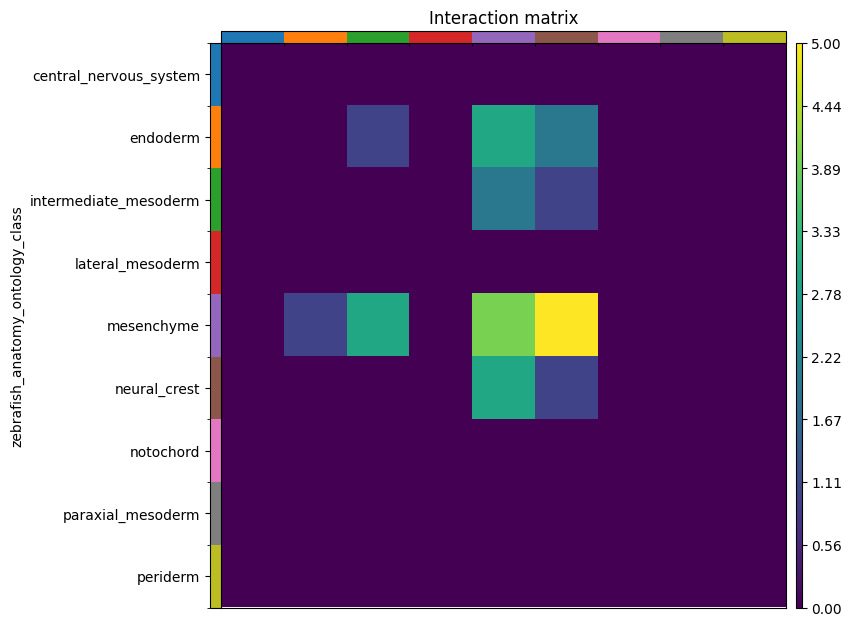

In [ ]:
#load only 12hpf timpoint in sp_data

import anndata as ad
cluster_key = "zebrafish_anatomy_ontology_class"


# Load the data
adata = sp_data
print(adata)

adata.obsm['spatial'] = np.vstack([adata.obs['spatial_x'].values, adata.obs['spatial_y'].values]).T
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)


sq.gr.ligrec(adata,n_perms=1000,cluster_key="zebrafish_anatomy_ontology_class", n_jobs=8, use_raw=False, transmitter_params={"categories": "ligand"},
receiver_params={"categories": "receptor"} )


clusters = adata.obs.zebrafish_anatomy_ontology_class.cat.categories
means = adata.uns["zebrafish_anatomy_ontology_class_ligrec"]["means"]
pval = adata.uns["zebrafish_anatomy_ontology_class_ligrec"]["pvalues"]

interactions = np.ma.masked_where((pval < 0.9) & (means>1), means).mask.sum(0)
interactions = np.reshape(interactions, (clusters.shape[0],clusters.shape[0]))
adata.uns["zebrafish_anatomy_ontology_class_interactions"] = interactions
sq.pl.interaction_matrix(adata, cluster_key = "zebrafish_anatomy_ontology_class")


At 12 hpf, zebrafish embryos are deeply involved in the process of gastrulation. Critical developmental events include the continued movement and differentiation of cells, which will form the various tissues and organ systems. The interactions you've highlighted align well with the biological processes occurring at this stage:


- Mesenchyme and Neural Crest (Very Significant): This strong interaction likely reflects the critical role of both cell types in forming structural components of the embryo. Neural crest cells contribute to craniofacial development and peripheral nervous system structures, while mesenchymal cells are integral in forming connective tissue and skeletal elements. The significant interaction at this stage could denote a high level of interplay necessary for coordinating the development of these complex structures.

- Endoderm and Mesenchyme: The endoderm at this stage is involved in forming the internal organs, particularly the digestive tract, while the mesenchyme (which can include cells derived from the mesoderm) can differentiate into various structures including skeletal and connective tissues. Interaction between these cell types could be crucial for signaling pathways that guide organ placement and the structural development surrounding these organs.

- Intermediate Mesoderm and Mesenchyme: The intermediate mesoderm is a precursor to many internal structures, including parts of the urogenital system. Its interaction with the mesenchyme could be significant for coordinating the development of these systems, especially in terms of structural and supportive tissues that are mesenchyme-derived.

- Endoderm and Neural Crest: The neural crest cells are highly migratory and differentiate into a diverse array of tissues including peripheral nerves, facial cartilage, and melanocytes. Interaction between the neural crest and endoderm could be part of the complex signaling that influences the development of the pharyngeal arches and associated structures within the throat and facial areas.


AnnData object with n_obs × n_vars = 19102 × 18698
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'seurat_clusters', 'spatial_x', 'spatial_y', 'slice', 'time_point', 'bin_annotation', 'colors', 'layer_annotation', 'layer_colors', 'uniform_density', 'rna_count_based_density', 'zebrafish_anatomy_ontology_class', 'max_probability_value'
    var: 'n_cells', 'sparsity'
    uns: 'overlap_genes', 'training_genes'
    obsm: 'tangram_ct_pred'
    layers: 'counts'


  0%|          | 0/1000 [00:00<?, ?permutation/s]

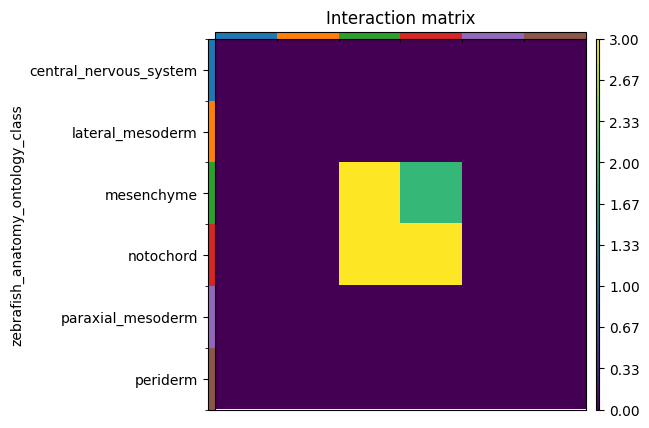

In [ ]:
#load only 10hpf timpoint in sp_data

import anndata as ad
cluster_key = "zebrafish_anatomy_ontology_class"


# Load the data
adata = sp_data
print(adata)

adata.obsm['spatial'] = np.vstack([adata.obs['spatial_x'].values, adata.obs['spatial_y'].values]).T
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)


sq.gr.ligrec(adata,n_perms=1000,cluster_key="zebrafish_anatomy_ontology_class", n_jobs=8, use_raw=False, transmitter_params={"categories": "ligand"},
receiver_params={"categories": "receptor"} )


clusters = adata.obs.zebrafish_anatomy_ontology_class.cat.categories
means = adata.uns["zebrafish_anatomy_ontology_class_ligrec"]["means"]
pval = adata.uns["zebrafish_anatomy_ontology_class_ligrec"]["pvalues"]

interactions = np.ma.masked_where((pval < 0.9) & (means>1), means).mask.sum(0)
interactions = np.reshape(interactions, (clusters.shape[0],clusters.shape[0]))
adata.uns["zebrafish_anatomy_ontology_class_interactions"] = interactions
sq.pl.interaction_matrix(adata, cluster_key = "zebrafish_anatomy_ontology_class")


- At 10 hpf, zebrafish embryos are in the early phases of gastrulation, where cell movements are crucial for the formation of primary germ layers and axial structures. The interaction between mesenchyme and notochord is plausible as these are critical in organizing the body plan, particularly in forming the axial skeleton and surrounding tissues.


### Cell Transition

In this step we will investigate how different cell types transition into other cell types using genes that are involved in apoptosis processes. We will be using Moscot Spatiotemporal problem solving feature.

In [ ]:
# Load the data taht contains all time points
adata = ad.read_h5ad("spatial_sixtime_slice_stereoseq.h5ad")

# Extract spatial coordinates and combine them
adata.obsm['spatial'] = np.vstack([adata.obs['spatial_x'].values, adata.obs['spatial_y'].values]).T

# Select only our timepoints
adata = adata[adata.obs['time'].isin(['10hpf', '12hpf', '24hpf']), :]


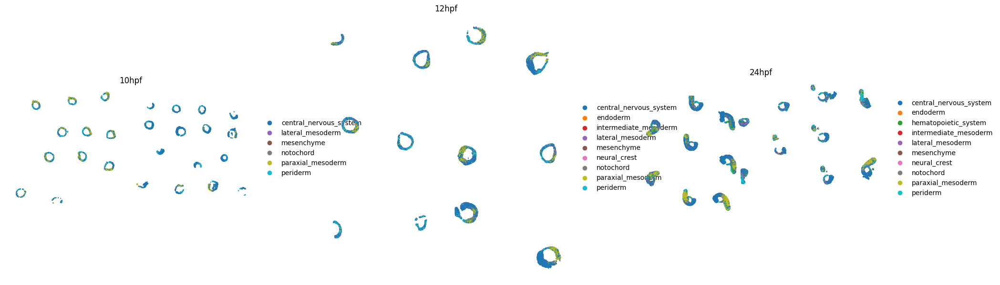

In [ ]:
# Plot the spatial data. You can change layer_annotation to otehr annotations

library_ids = list(adata.obs["time_point"].cat.categories)
sq.pl.spatial_scatter(
    adata,
    color="zebrafish_anatomy_ontology_class",
    frameon=False,
    shape=None,
    library_key="time_point",
    library_id=library_ids,
    title=library_ids,
    figsize=(7, 9),
    legend_fontsize=10,

)

In [ ]:

adata.obs['time_point'] = adata.obs['time_point'].str.replace('hpf', '').astype(int)
adata.obs['time_point'] = pd.Categorical(adata.obs['time_point'])


# This initializes the Problem


In [ ]:
stp = SpatioTemporalProblem(adata)

Since moscot by default doesn't have a set of apoptosis genes for zebrafish, we will use these genes to pass to our stp solver. These genes are gathered by searching through literature and with the help of large language models.


**Apoptosis genes**:


bida - Bida, a variant of the Bid protein in zebrafish, mediates the mitochondrial pathway of apoptosis by activating pro-apoptotic proteins like Bax.

aifm1 - Aifm1 is involved in caspase-independent apoptosis in zebrafish, crucial for DNA fragmentation and chromatin condensation during apoptosis.

aifm2 - Similar to Aifm1, Aifm2 plays a role in caspase-independent apoptosis, participating in the nuclear translocation process that leads to chromosomal DNA degradation.

aifm3 - In zebrafish, Aifm3 contributes to the regulation of mitochondrial integrity and the release of pro-apoptotic factors during cell death.

aifm4 - Aifm4 is involved in mitochondrial dysfunction and promotes apoptosis by interfering with mitochondrial electron transport in zebrafish.

aifm5 - This protein supports apoptosis by aiding in the dismantling of mitochondrial structures necessary for cell survival in zebrafish.

aif1l - Aif1l acts in zebrafish to support apoptosis through mechanisms that are still under investigation, potentially involving mitochondrial signaling.

naif1 - Naif1 in zebrafish is implicated in nuclear events associated with apoptosis, particularly in response to cellular stress.

casp2 - Caspase-2 in zebrafish initiates apoptosis signaling pathways, often in response to DNA damage and other cellular stress.

casp3a - Caspase-3a is a key effector caspase in zebrafish, essential for the execution phase of apoptosis, involving the cleavage of cellular components.

casp3b - Similar to Caspase-3a, Caspase-3b facilitates the breakdown of cellular structures during apoptosis in zebrafish.

casp6a - Caspase-6a in zebrafish is involved in the degradation of nuclear proteins during apoptosis.

casp6b.1 - This isoform contributes specifically to the cleavage of cytoskeletal proteins in zebrafish during apoptosis.

casp6b.2 - Similar to Caspase-6b.1, this enzyme targets different substrates to mediate cellular disassembly during apoptosis.

casp7 - Caspase-7 plays a role in dismantling cellular structures and executing apoptosis in zebrafish.

casp8 - An initiator caspase, Caspase-8 triggers the extrinsic pathway of apoptosis in zebrafish in response to external death signals.

casp9 - Caspase-9 is crucial for initiating the intrinsic apoptosis pathway in zebrafish, mediated by mitochondrial damage.

casp10 - Similar to caspase-8, Caspase-10 in zebrafish is involved in the extrinsic apoptosis pathway, responding to death receptor signaling.

casp20 - This caspase's role in zebrafish apoptosis is less clear, but it likely participates in specific cell death pathways.

casp21 - Caspase-21 in zebrafish might be involved in specialized apoptosis pathways or immune responses.

casp22 - Caspase-22's specific function in zebrafish apoptosis is under investigation, but it may be linked to inflammation-related cell death.

casp23 - Caspase-23 in zebrafish is believed to play a role in inflammation and possibly apoptosis through unknown mechanisms.

casp8ap2 - This protein aids in amplifying the apoptosis signal initiated by Caspase-8 in zebrafish.

caspa - Caspase A participates in apoptosis in zebrafish, specifically through its role in the degradation of key cellular components.

caspb - Caspase B is an effector caspase in zebrafish, involved in the terminal stages of the apoptosis process.

caspbl - Caspase BL's exact role in zebrafish apoptosis is not well-defined but is assumed to participate in cell death processes.

tnfa - TNF-alpha in zebrafish initiates inflammation and can induce apoptosis through its receptors.

tnfaip1 through tnfaip8l3 - These TNF alpha-induced proteins in zebrafish regulate various aspects of the inflammatory response and can influence apoptosis indirectly through pathways involving NF-κB and other transcription factors.

noxa1 - Noxa1 in zebrafish acts as a pro-apoptotic protein, regulating apoptosis through the mitochondrial pathway and influencing p53-mediated cell death.



**Proliferation Genes**:



pcna - Proliferating Cell Nuclear Antigen is crucial for DNA replication and repair, often used as a marker of cell proliferation.

ccnd1 - Cyclin D1 regulates the cell cycle G1/S transition by activating CDK4 and CDK6.

ccne1 - Cyclin E1 controls the G1/S phase transition of the cell cycle by activating CDK2.

cdk2 - Cyclin-Dependent Kinase 2 is essential for the control of the cell cycle at the G1 to S transition.

cdk4 - Cyclin-Dependent Kinase 4 plays a key role in driving the cell cycle through the G1 phase.

mcm2, mcm3, mcm4, mcm5, mcm6, mcm7 - These Minichromosome Maintenance Complex components are essential for the initiation and elongation phases of DNA replication.

egr1 - Early Growth Response 1 is a transcription factor that modulates genes important for cell growth and survival.

mdm2 - Mouse Double Minute 2 Homolog negatively regulates the p53 tumor suppressor, playing a crucial role in cell cycle progression and survival.

myca - A variant of the Myc gene, which is a major regulator of cell growth, metabolism, and proliferation.

mycb - Similar to Myca, Mycb is involved in controlling gene expression that regulates cell cycle and growth.

mycbp - Myc Binding Protein, which interacts with Myc to modulate its function in promoting cell proliferation.

mycbp2 - Myc Binding Protein 2, acts in the regulation of transcription factors and is involved in neuronal differentiation and growth.

mycbpap - Myc Binding Protein Associated Protein, influences Myc-driven transcription and thus affects proliferation.

mych - Another Myc family member, involved in regulating cellular growth and differentiation.

mycla - A variant of L-Myc, involved in cell growth regulation and linked to various cancers.

myclb - Similar to Mycla, Myclb is a less common Myc family member with roles in cell cycle regulation.

mycn - N-Myc is crucial for normal development and is often amplified in cancer, where it drives proliferation.

myct1a and myct1b - Not much is typically known about these specific genes, suggesting they might be theoretical or less commonly referenced in standard gene databases.

chka and chkb - Choline kinase A and B catalyze the phosphorylation of choline, which is important for cell membrane synthesis and possibly proliferation signaling.

mki67 - Marker of proliferation Ki-67 is present during all active phases of the cell cycle and is widely used as a proliferation marker in cancer studies.

In [ ]:

apoptosis_genes = [
'apaf1', 'endog', 'xiap', 'fadd',
'bida', # Variant of Bid
'aifm1', 'aifm2', 'aifm3', 'aifm4', 'aifm5', # Variants of AIF
'aif1l', 'naif1', # Likely related to AIF gene family
'casp2', 'casp3a', 'casp3b', 'casp6a', 'casp6b.1', 'casp6b.2', 'casp7', 'casp8', 'casp9',
'casp10', 'casp20', 'casp21', 'casp22', 'casp23', # Various caspase enzymes
'casp8ap2', # Related to Caspase 8-associated protein 2
'caspa', 'caspb', 'caspbl', # Likely variants or specific isoforms of caspases
'tnfa', # Tumor necrosis factor-alpha
'tnfaip1', 'tnfaip2a', 'tnfaip2b', 'tnfaip3', 'tnfaip6', 'tnfaip8l1', 'tnfaip8l2a', 'tnfaip8l2b', 'tnfaip8l3',
# Members of the TNF alpha-induced proteins
'noxa1', # Related to Noxa
'fas'
]

proliferation_genes = [
    'pcna',  # Proliferating Cell Nuclear Antigen
    'ccnd1',  # Cyclin D1
    'ccne1',  # Cyclin E1
    'cdk2',  # Cyclin-Dependent Kinase 2
    'cdk4',  # Cyclin-Dependent Kinase 4
    'mcm2', 'mcm3', 'mcm4', 'mcm5', 'mcm6', 'mcm7',  # Minichromosome Maintenance Complex Components 2-7
    'egr1',  # Early Growth Response 1
    'mdm2',  # Mouse Double Minute 2 Homolog
     "myca", "mycb", "mycbp", "mycbp2", "mycbpap",
    "mych", "mycla", "myclb", "mycn", "myct1a",
    "myct1b", "chka", "chkb", "mki67"
]


stp = stp.score_genes_for_marginals(gene_set_apoptosis=apoptosis_genes, gene_set_proliferation=proliferation_genes)



In [ ]:

stp = stp.prepare(
    time_key="time_point",
    spatial_key="spatial",
    joint_attr=None,
    callback="local-pca",
)

INFO     Computing pca with `n_comps=30` for `xy` using `adata.X`                                                  
INFO     Normalizing spatial coordinates of `x`.                                                                   
INFO     Normalizing spatial coordinates of `y`.                                                                   
INFO     Computing pca with `n_comps=30` for `xy` using `adata.X`                                                  
INFO     Normalizing spatial coordinates of `x`.                                                                   
INFO     Normalizing spatial coordinates of `y`.                                                                   


In [ ]:
stp = stp.solve(alpha=1.0,device='cpu')

INFO     Solving `2` problems                                                                                      
INFO     Solving problem BirthDeathProblem[stage='prepared', shape=(2081, 5271)].                                  


INFO:jax._src.xla_bridge:Unable to initialize backend 'cuda': jaxlib/cuda/versions_helpers.cc:98: operation cuInit(0) failed: Unknown CUDA error 303; cuGetErrorName failed. This probably means that JAX was unable to load the CUDA libraries.
INFO:jax._src.xla_bridge:Unable to initialize backend 'rocm': NOT_FOUND: Could not find registered platform with name: "rocm". Available platform names are: CUDA
INFO:jax._src.xla_bridge:Unable to initialize backend 'tpu': INTERNAL: Failed to open libtpu.so: libtpu.so: cannot open shared object file: No such file or directory


Let's visualize transition from 12hpf to 24hpf.

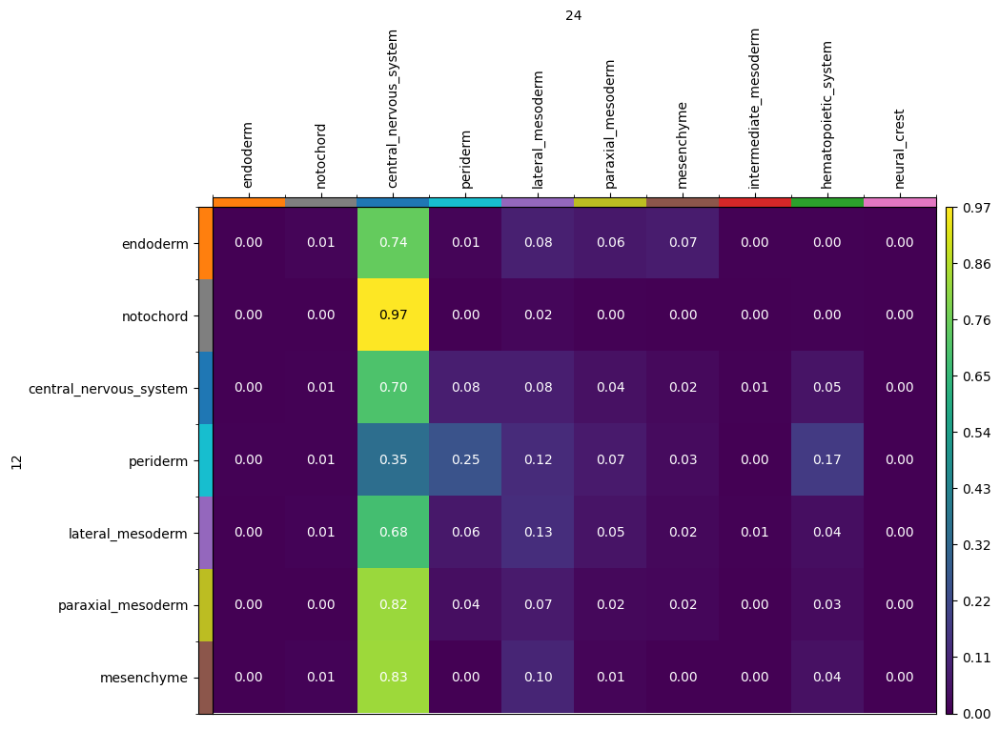

In [ ]:
# Transition from 12hpf to 24hpf

celltypes_source_2 = adata[adata.obs["time_point"] == 12].obs["zebrafish_anatomy_ontology_class"].cat.categories
celltypes_target_2 = adata[adata.obs["time_point"] == 24].obs["zebrafish_anatomy_ontology_class"].cat.categories
celltypes_intersection_2 = list(
    set(celltypes_source_2).intersection(celltypes_target_2)
)
source_ordered_2 = celltypes_intersection_2 + list(
    set(celltypes_source_2) - set(celltypes_target_2)
)
target_ordered_2 = celltypes_intersection_2 + list(
    set(celltypes_target_2) - set(celltypes_source_2)
)

stp.cell_transition(
    source=12,
    target=24,
    source_groups={"zebrafish_anatomy_ontology_class": source_ordered_2},
    target_groups={"zebrafish_anatomy_ontology_class": target_ordered_2},
    forward=True,
)
mtp.cell_transition(stp, fontsize=10, figsize=(8, 8))

Some of the transitions appear as expected, while others seem biased, possibly towards the majority class. We will discuss cell transitions further in the next section, using scRNA-seq data.

## **cell-cell interactions for scRNA-seq**

Let's repeat the processes that we did for scRNA-seq and see if get roughly the same results.

AnnData object with n_obs × n_vars = 12914 × 25683
    obs: 'n_genes', 'n_counts', 'fish', 'timepoint_cluster', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_nc', 'pct_counts_nc', 'developmental_stage', 'timepoint', 'zebrafish_anatomy_ontology_class', 'zebrafish_anatomy_ontology_id', 'slice', 'spatial_x', 'spatial_y'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'nc', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'sparsity'
    uns: 'global_annotation_colors', 'timepoint_colors', 'zebrafish_anatomy_ontology_class_colors', 'zebrafish_anatomy_ontology_id_colors', 'rank_genes_groups', 'log1p', 'hvg', 'training_genes', 'overlap_genes', 'zebrafish_anatomy_ontology_class_ligrec', 'zebrafish_anatomy_ontology_class_interactions'
    obsm: 'X_umap'
    layers: 'counts'


  0%|          | 0/1000 [00:00<?, ?permutation/s]

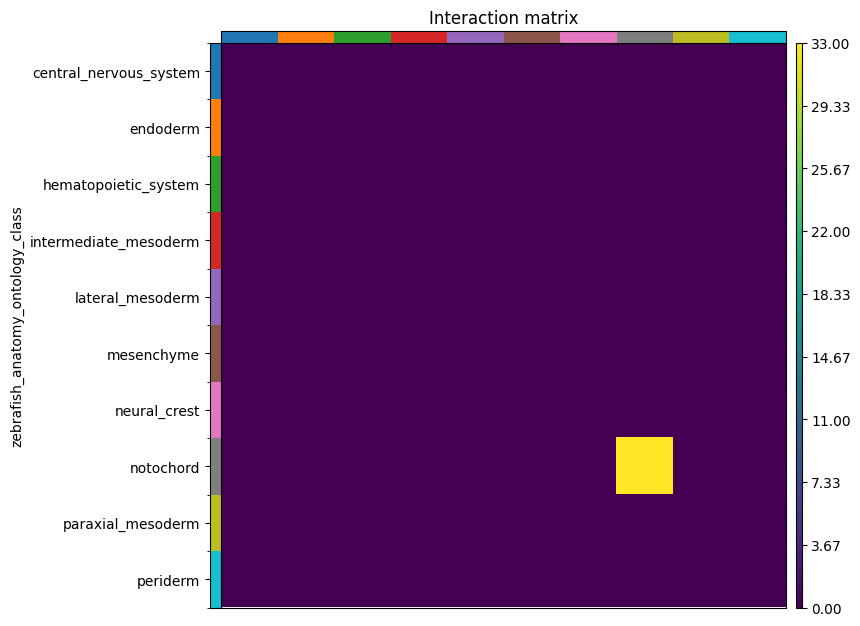

In [ ]:
#load only 24hpf timpoint in sc_data

import anndata as ad
cluster_key = "zebrafish_anatomy_ontology_class"

# Load the data
adata = sc_data
print(adata)



sq.gr.ligrec(adata,n_perms=1000,cluster_key="zebrafish_anatomy_ontology_class", n_jobs=8, use_raw=False, transmitter_params={"categories": "ligand"},
receiver_params={"categories": "receptor"} )

clusters = adata.obs.zebrafish_anatomy_ontology_class.cat.categories
means = adata.uns["zebrafish_anatomy_ontology_class_ligrec"]["means"]
pval = adata.uns["zebrafish_anatomy_ontology_class_ligrec"]["pvalues"]

interactions = np.ma.masked_where((pval < 0.9) & (means>1), means).mask.sum(0)
interactions = np.reshape(interactions, (clusters.shape[0],clusters.shape[0]))
adata.uns["zebrafish_anatomy_ontology_class_interactions"] = interactions
sq.pl.interaction_matrix(adata, cluster_key = "zebrafish_anatomy_ontology_class")

AnnData object with n_obs × n_vars = 6699 × 24027
    obs: 'n_genes', 'n_counts', 'fish', 'timepoint_cluster', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_nc', 'pct_counts_nc', 'developmental_stage', 'timepoint', 'zebrafish_anatomy_ontology_class', 'zebrafish_anatomy_ontology_id', 'slice', 'spatial_x', 'spatial_y'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'nc', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'sparsity'
    uns: 'global_annotation_colors', 'timepoint_colors', 'zebrafish_anatomy_ontology_class_colors', 'zebrafish_anatomy_ontology_id_colors', 'rank_genes_groups', 'log1p', 'hvg', 'training_genes', 'overlap_genes'
    obsm: 'X_umap'
    layers: 'counts'


  0%|          | 0/1000 [00:00<?, ?permutation/s]

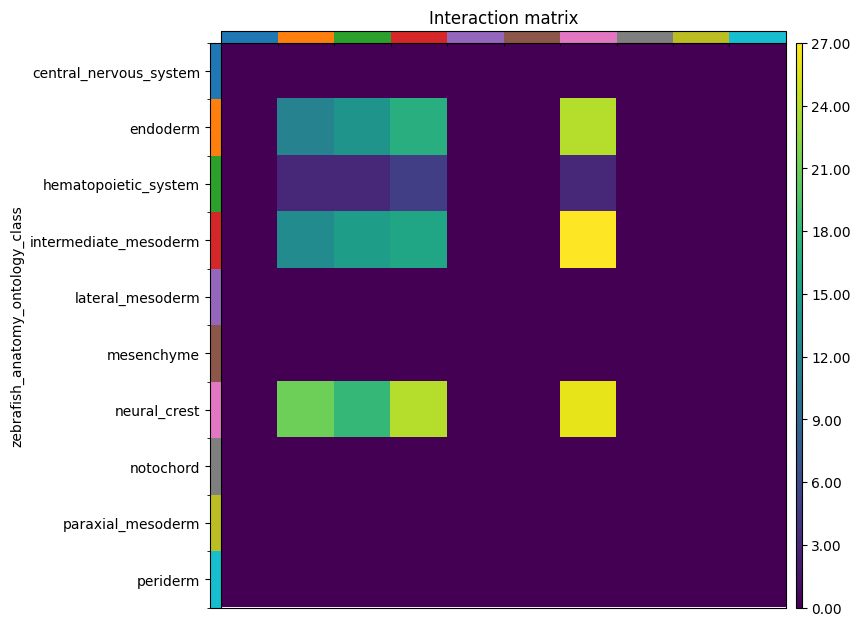

In [ ]:
#load only 12hpf timpoint in sc_data


import anndata as ad
cluster_key = "zebrafish_anatomy_ontology_class"

# Load the data
adata = sc_data
print(adata)



sq.gr.ligrec(adata,n_perms=1000,cluster_key="zebrafish_anatomy_ontology_class", n_jobs=8, use_raw=False, transmitter_params={"categories": "ligand"},
receiver_params={"categories": "receptor"} )


clusters = adata.obs.zebrafish_anatomy_ontology_class.cat.categories
means = adata.uns["zebrafish_anatomy_ontology_class_ligrec"]["means"]
pval = adata.uns["zebrafish_anatomy_ontology_class_ligrec"]["pvalues"]

interactions = np.ma.masked_where((pval < 0.9) & (means>1), means).mask.sum(0)
interactions = np.reshape(interactions, (clusters.shape[0],clusters.shape[0]))
adata.uns["zebrafish_anatomy_ontology_class_interactions"] = interactions
sq.pl.interaction_matrix(adata, cluster_key = "zebrafish_anatomy_ontology_class")

AnnData object with n_obs × n_vars = 1251 × 21330
    obs: 'n_genes', 'n_counts', 'fish', 'timepoint_cluster', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_nc', 'pct_counts_nc', 'developmental_stage', 'timepoint', 'zebrafish_anatomy_ontology_class', 'zebrafish_anatomy_ontology_id', 'slice', 'spatial_x', 'spatial_y'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'nc', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'sparsity'
    uns: 'global_annotation_colors', 'timepoint_colors', 'zebrafish_anatomy_ontology_class_colors', 'zebrafish_anatomy_ontology_id_colors', 'rank_genes_groups', 'log1p', 'hvg', 'training_genes', 'overlap_genes'
    obsm: 'X_umap'
    layers: 'counts'


  0%|          | 0/1000 [00:00<?, ?permutation/s]

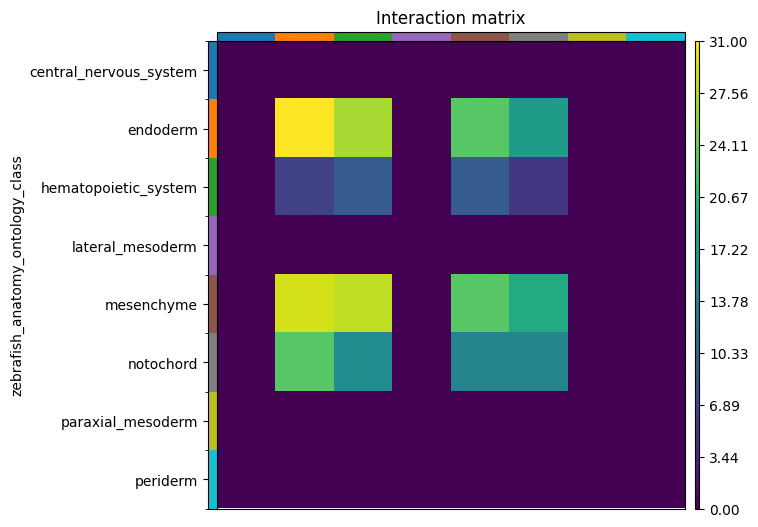

In [ ]:
#load only 10hpf timpoint in sc_data


import anndata as ad
cluster_key = "zebrafish_anatomy_ontology_class"

# Load the data
adata = sc_data
print(adata)



sq.gr.ligrec(adata,n_perms=1000,cluster_key="zebrafish_anatomy_ontology_class", n_jobs=8, use_raw=False, transmitter_params={"categories": "ligand"},
receiver_params={"categories": "receptor"} )


clusters = adata.obs.zebrafish_anatomy_ontology_class.cat.categories
means = adata.uns["zebrafish_anatomy_ontology_class_ligrec"]["means"]
pval = adata.uns["zebrafish_anatomy_ontology_class_ligrec"]["pvalues"]

interactions = np.ma.masked_where((pval < 0.9) & (means>1), means).mask.sum(0)
interactions = np.reshape(interactions, (clusters.shape[0],clusters.shape[0]))
adata.uns["zebrafish_anatomy_ontology_class_interactions"] = interactions
sq.pl.interaction_matrix(adata, cluster_key = "zebrafish_anatomy_ontology_class")

Great! our results using scRNA-seq are also aligned with results we got using Streo-seq

### Cell Transition

In [ ]:
sp_seq_data_combined = sc.concat([scrna_seq_data10, scrna_seq_data12, scrna_seq_data24], join='outer')

adata= sp_seq_data_combined

In [ ]:
# Extract spatial coordinates and combine them
adata.obsm['spatial'] = np.vstack([adata.obs['spatial_x'].values, adata.obs['spatial_y'].values]).T
adata.obsm['spatial'] = np.array(adata.obsm['spatial'], dtype=int)



In [ ]:

adata.obs['timepoint'] = adata.obs['timepoint'].str.replace('hpf', '').astype(int)
adata.obs['timepoint'] = pd.Categorical(adata.obs['timepoint'])


# This initializes the Problem


In [ ]:
stp = SpatioTemporalProblem(adata)

In [ ]:

apoptosis_genes = [
'apaf1', 'endog', 'xiap', 'fadd',
'bida', # Variant of Bid
'aifm1', 'aifm2', 'aifm3', 'aifm4', 'aifm5', # Variants of AIF
'aif1l', 'naif1', # Likely related to AIF gene family
'casp2', 'casp3a', 'casp3b', 'casp6a', 'casp6b.1', 'casp6b.2', 'casp7', 'casp8', 'casp9',
'casp10', 'casp20', 'casp21', 'casp22', 'casp23', # Various caspase enzymes
'casp8ap2', # Related to Caspase 8-associated protein 2
'caspa', 'caspb', 'caspbl', # Likely variants or specific isoforms of caspases
'tnfa', # Tumor necrosis factor-alpha
'tnfaip1', 'tnfaip2a', 'tnfaip2b', 'tnfaip3', 'tnfaip6', 'tnfaip8l1', 'tnfaip8l2a', 'tnfaip8l2b', 'tnfaip8l3',
# Members of the TNF alpha-induced proteins
'noxa1', # Related to Noxa
'fas'
]


stp = stp.score_genes_for_marginals(gene_set_apoptosis=apoptosis_genes
)



In [ ]:

stp = stp.prepare(
    time_key="timepoint",
    spatial_key="spatial",
    joint_attr=None,
    callback="local-pca",
)

INFO     Computing pca with `n_comps=30` for `xy` using `adata.X`                                                  
INFO     Normalizing spatial coordinates of `x`.                                                                   
INFO     Normalizing spatial coordinates of `y`.                                                                   
INFO     Computing pca with `n_comps=30` for `xy` using `adata.X`                                                  
INFO     Normalizing spatial coordinates of `x`.                                                                   
INFO     Normalizing spatial coordinates of `y`.                                                                   


In [ ]:
stp = stp.solve(alpha=1.0,device='gpu')

INFO     Solving `2` problems                                                                                      
INFO     Solving problem BirthDeathProblem[stage='prepared', shape=(753, 826)].                                    


INFO:jax._src.xla_bridge:Unable to initialize backend 'rocm': NOT_FOUND: Could not find registered platform with name: "rocm". Available platform names are: CUDA
INFO:jax._src.xla_bridge:Unable to initialize backend 'tpu': INTERNAL: Failed to open libtpu.so: libtpu.so: cannot open shared object file: No such file or directory


WARNING  Solver did not converge                                                                                   
INFO     Solving problem BirthDeathProblem[stage='prepared', shape=(82, 753)].                                     
WARNING  Solver did not converge                                                                                   


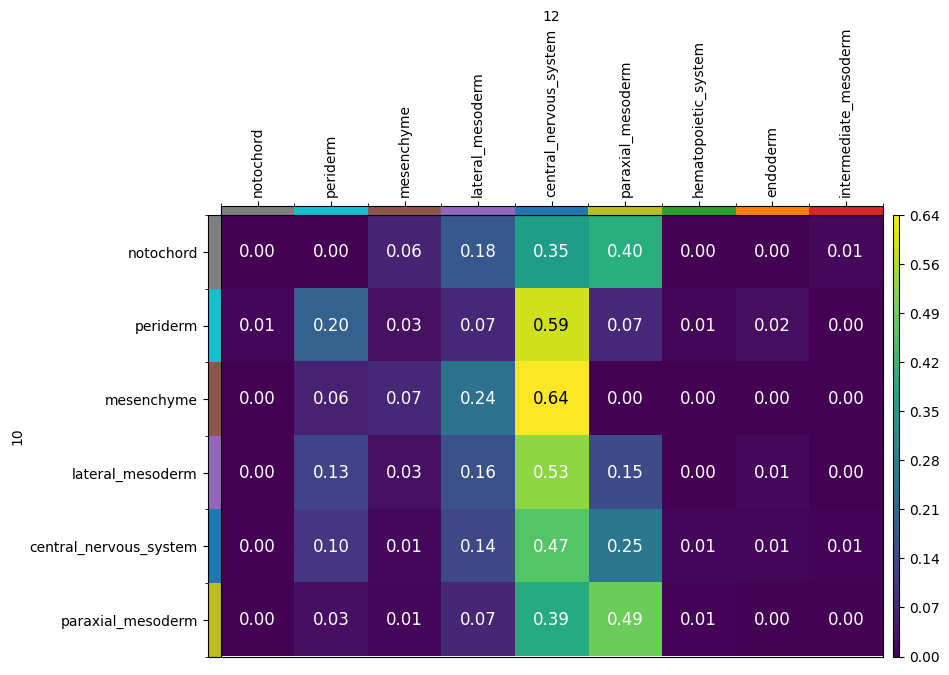

In [ ]:
celltypes_source_1 = adata[adata.obs["timepoint"] == 10].obs["zebrafish_anatomy_ontology_class"].cat.categories
celltypes_target_1 = adata[adata.obs["timepoint"] == 12].obs["zebrafish_anatomy_ontology_class"].cat.categories
celltypes_intersection_1 = list(
    set(celltypes_source_1).intersection(celltypes_target_1)
)
source_ordered_1 = celltypes_intersection_1 + list(
    set(celltypes_source_1) - set(celltypes_target_1)
)
target_ordered_1 = celltypes_intersection_1 + list(
    set(celltypes_target_1) - set(celltypes_source_1)
)

stp.cell_transition(
    source=10,
    target=12,
    source_groups={"zebrafish_anatomy_ontology_class": source_ordered_1},
    target_groups={"zebrafish_anatomy_ontology_class": target_ordered_1},
    forward=True,
)
mtp.cell_transition(stp, fontsize=12, figsize=(7, 7))

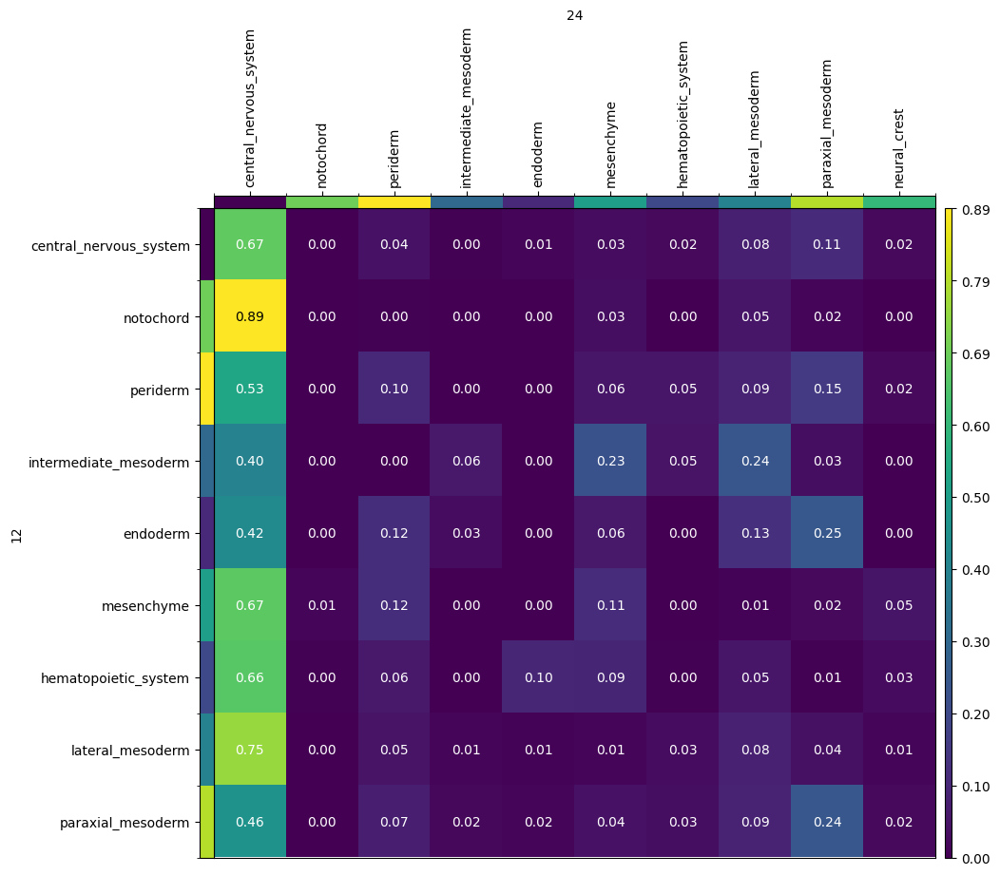

In [ ]:
# Transition from 12hpf to 24hpf

celltypes_source_2 = adata[adata.obs["timepoint"] == 12].obs["zebrafish_anatomy_ontology_class"].cat.categories
celltypes_target_2 = adata[adata.obs["timepoint"] == 24].obs["zebrafish_anatomy_ontology_class"].cat.categories
celltypes_intersection_2 = list(
    set(celltypes_source_2).intersection(celltypes_target_2)
)
source_ordered_2 = celltypes_intersection_2 + list(
    set(celltypes_source_2) - set(celltypes_target_2)
)
target_ordered_2 = celltypes_intersection_2 + list(
    set(celltypes_target_2) - set(celltypes_source_2)
)

stp.cell_transition(
    source=12,
    target=24,
    source_groups={"zebrafish_anatomy_ontology_class": source_ordered_2},
    target_groups={"zebrafish_anatomy_ontology_class": target_ordered_2},
    forward=True,
)
mtp.cell_transition(stp, fontsize=10, figsize=(8, 8))

**Central Nervous System (CNS) Cells**:

The majority remain as CNS cells (0.674), demonstrating strong self-renewal or maintenance of this cell type.
Smaller fractions differentiate into other cell types, including lateral mesoderm and paraxial mesoderm, which may indicate some plasticity or interaction between these tissues.

**Notochord**:

Predominantly transitions to the CNS (0.893), a surprisingly high rate that might suggest a developmental or experimental anomaly, as notochord typically provides structural support and signals for the developing nervous system but does not transform into it.

**Periderm:**

A significant fraction transitions to the CNS (0.527), indicating a possible role in supporting CNS development or a methodological aspect in how cell identities are being assigned or traced.

**Intermediate Mesoderm**:

Transitions into a variety of tissues including CNS (0.395), lateral mesoderm, and mesenchyme, reflecting its role as a versatile embryonic tissue.
Endoderm:

Also shows a strong transition to the CNS (0.424), which is unusual under normal circumstances as endoderm generally forms internal organ linings, suggesting a possible experimental or data interpretation error or unique developmental conditions.

**Mesenchyme**:

Shows transitions primarily to the CNS (0.667) and remains partly as mesenchyme, reflecting its known role in contributing to various structures, including those in the nervous system.

**Hematopoietic System**:

Predominantly transitions to the CNS (0.660), with other transitions indicating interactions with various mesodermal derivatives.

**Lateral Mesoderm**:

Strongly transitions to CNS (0.754), indicating a major commitment to CNS formation or an aspect of neural crest or other neural derivatives during this stage.

**Paraxial Mesoderm**:

Transitions to a variety of tissues, with a notable portion remaining as paraxial mesoderm (0.242) and transitioning to CNS (0.458), suggesting its contribution to both somitic structures and possibly neural tissue.


Let's pin out some unusual transition and discuss what might be the root cause of it.


**Unusual Transitions**:

Endoderm to CNS (0.424): This is highly unusual because endoderm typically gives rise to internal organs like the digestive tract and lungs, not the central nervous system.

Notochord to CNS (0.893): Similarly, this transition is unexpected. The notochord is a structural element that defines the axis of the embryo and induces the formation of the neural tube by signaling, rather than converting into neural tissue.

Periderm to CNS (0.527): The periderm is an external layer of cells in fish and generally does not contribute to the central nervous system, making this a highly unusual observation.

Significant Portions of Lateral Mesoderm to CNS (0.754) and Hematopoietic System to CNS (0.660): While some mesodermal or hematopoietic cells may become part of the neural crest or related structures, such large-scale transitions directly into the central nervous system are not typical in vertebrate embryology.

having an unbalanced dataset where approximately 50% of the data is composed of central nervous system (CNS) cells could contribute to some of the issues and unusual findings you're seeing in transition matrix. Here's how an unbalanced dataset might impact your analysis:

1. Bias Towards Over-representation

2. Under-representation of Other Classes

Further investigation is needed to identify the root cause of this issue and to find ways to address it.






